Final

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def load_scenario_data(path):
    df = pd.read_csv(path)
    year_cols = [str(year) for year in range(2024, 2051)]
    
    scenario_data = {}
    for country in df['Region'].unique():
        country_data = df[df['Region'] == country]
        yearly_totals = {}
        
        for year in year_cols:
            year_total = country_data[year].sum()
            yearly_totals[int(year)] = year_total
                
        scenario_data[country] = yearly_totals
    
    return scenario_data

def load_and_process_data(base_path, country_code):
    files = {
        'maturity': f'v2_power_plant_phaseout_order_by_maturity_{country_code}_2050.csv',
        'emission_factor': f'v2_power_plant_phaseout_order_by_emission_factor_{country_code}_2050.csv',
        # Removed the benefits_cost criteria 
        'benefits_cost_maturity': f'v2_power_plant_phaseout_order_by_emissions_per_OC_maturity_{country_code}_2050.csv'
    }
    
    dfs = {}
    for key, filename in files.items():
        file_path = Path(base_path) / filename
        df = pd.read_csv(file_path)
        
        annual_data = []
        current_rank = 1
        cumulative_emissions = 0
        
        available_years = sorted(df['year'].unique())
        all_years = list(range(2024, 2051))
        
        for year in all_years:
            if year in available_years:
                year_plants = df[df['year'] == year]
                
                # Consider the fraction column for calculating effective number of plants
                if 'fraction' in year_plants.columns:
                    # Sum of fractions gives effective number of plants
                    effective_n_plants = year_plants['fraction'].sum()
                    # Calculate weighted rank increment based on fraction
                    rank_increment = effective_n_plants
                else:
                    # If fraction column doesn't exist, use traditional count
                    effective_n_plants = len(year_plants)
                    rank_increment = effective_n_plants
                
                year_emissions = year_plants['amount_mtco2'].sum()
                cumulative_emissions += year_emissions
                
                # Create default dictionary for subsectors
                subsector_dict = {'Coal': 0, 'Gas': 0, 'Oil': 0}
                # Update with actual values
                for subsector, amount in year_plants.groupby('subsector')['amount_mtco2'].sum().to_dict().items():
                    subsector_dict[subsector] = amount
                
                annual_data.append({
                    'year': year,
                    'amount_mtco2': year_emissions,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank + rank_increment,
                    'n_plants': effective_n_plants,
                    'plants_by_subsector': subsector_dict
                })
                current_rank += rank_increment
            else:
                annual_data.append({
                    'year': year,
                    'amount_mtco2': 0,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank,
                    'n_plants': 0,
                    'plants_by_subsector': {'Coal': 0, 'Gas': 0, 'Oil': 0}
                })
        
        dfs[key] = pd.DataFrame(annual_data)
    
    return dfs

def create_visualization(country_code, country_name, base_path, bau_data, scenario_data):
    dfs = load_and_process_data(base_path, country_code)
    
    fig, axes = plt.subplots(3, 1, figsize=(20, 20))
    
    titles = {
        'maturity': 'By Power Plant Maturity',
        'emission_factor': 'By Power Plant Emission Intensity',
        # Removed the benefits_cost entry
        'benefits_cost_maturity': 'By Power Plant Benefits/Costs (Including Plant Maturity)'
    }
    
    colors = {'Coal': '#8B4513', 'Gas': '#DAA520', 'Oil': '#2F4F4F'}
    
    # Removed country name from title
    
    fuel_patches = [plt.Rectangle((0,0), 1, 1, facecolor=colors[fuel], alpha=0.7) 
                   for fuel in ['Coal', 'Gas', 'Oil']]
    
    line_patches = [
        plt.Line2D([0], [0], color='black', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle=':')
    ]
    
    # Moved legends to the bottom
    fig.text(0.5, 0.06, '(N) = Number of plants shut down in that year\nStart Rank → End Rank of plants in phase-out sequence',
             fontsize=12, ha='center', va='top',
             bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    for idx, (key, df) in enumerate(dfs.items()):
        ax = axes[idx]
        ax2 = ax.twinx()
        
        years = list(range(2024, 2051))
        max_emissions = df['amount_mtco2'].max()
        min_val = -max_emissions*0.1
        
        annual_totals = df['amount_mtco2'].values
        ax.plot(years, annual_totals, 'k--', linewidth=2)
        
        for i, row in df.iterrows():
            bottom = 0
            for subsector, amount in row['plants_by_subsector'].items():
                ax.bar(row['year'], amount, bottom=bottom, 
                      color=colors[subsector], alpha=0.7,
                      width=0.9) 
                bottom += amount
            
            total_height = sum(row['plants_by_subsector'].values())
            
            if total_height > 0:
                # Black text (ranks) rounded to integers
                ax.text(row['year'], min_val*0.5,
                       f'{int(round(row["start_rank"]))}', 
                       ha='center', va='top',
                       fontsize=10)
                ax.text(row['year'], total_height + max_emissions*0.08, 
                       f'{int(round(row["end_rank"]))}', 
                       ha='center', va='bottom',
                       fontsize=10)
                # White text (plant counts) kept with one decimal place
                ax.text(row['year'], total_height/2, 
                       f'({row["n_plants"]:.1f})',
                       ha='center', va='center', 
                       color='white', 
                       fontweight='bold', fontsize=11)
        
        # Calculate cumulative difference from 2024 levels for scenario pathway
        cumulative_from_2024 = []
        for year in years:
            if year == 2024:
                cumulative_from_2024.append(0)
            else:
                total_diff = sum(scenario_data[2024] - scenario_data[y] for y in range(2024, year + 1))
                cumulative_from_2024.append(total_diff)
        
        # Calculate cumulative BAU vs scenario difference
        cumulative_bau_scenario = []
        for year in years:
            if year == 2024:
                cumulative_bau_scenario.append(0)
            else:
                bau_sum = sum(bau_data[y] for y in range(2024, year + 1))
                scenario_sum = sum(scenario_data[y] for y in range(2024, year + 1))
                year_difference = (bau_sum - scenario_sum)
                cumulative_bau_scenario.append(year_difference)
        
        ax2.plot(years, cumulative_from_2024, color='grey', linestyle='--', linewidth=1)
        ax2.plot(years, cumulative_bau_scenario, color='grey', linestyle=':', linewidth=1)
        
        ax.set_title(titles[key], pad=20, fontsize=14, fontweight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Annual Emission Reduction (MtCO2)', fontsize=12, labelpad=10)
        ax2.set_ylabel('Cumulative avoided emissions (GtCO2)', fontsize=12, labelpad=10)
        
        y2_ticks = ax2.get_yticks()
        ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
        
        max_cumulative = max(max(cumulative_from_2024), max(cumulative_bau_scenario))
        
        ax.set_ylim(min_val, max_emissions*1.2)
        ax2.set_ylim(min_val, max_cumulative*1.2)
        
        ax.tick_params(axis='both', labelsize=12)
        ax2.tick_params(axis='both', labelsize=12)
        
        ax.set_xticks(np.arange(2025, 2055, 5))
        ax.set_xticklabels([str(year) for year in range(2025, 2055, 5)])
        
        ax.spines['top'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        
        ax.grid(True, alpha=0.3, linestyle='--')
    
    # Moved legends to bottom
    fig.legend(fuel_patches, ['Coal', 'Gas', 'Oil'],
              loc='lower center', bbox_to_anchor=(0.5, 0.09), ncol=3, fontsize=14)
    
    fig.legend(line_patches, 
              ['Annual emissions reduction',
               'Cumulative avoided emissions\nrelative to current emission levels',
               'Cumulative avoided emissions\nrelative to BAU'],
              loc='lower center', bbox_to_anchor=(0.5, 0.06), ncol=3, fontsize=14)
    
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15) # Adjusted to make room for legends at bottom
    return fig

# Main execution
base_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data"
bau_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/annual BAU .csv"
scenario_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/Annual 1.5 50.csv"
    
# ISO code mapping
iso_mapping = {
    'IN': 'IND', 'ID': 'IDN', 'ZA': 'ZAF', 'MX': 'MEX', 
    'VN': 'VNM', 'IR': 'IRN', 'TH': 'THA', 'EG': 'EGY', 
    'TR': 'TUR', 'BD': 'BGD'
}

# Load scenario data
bau_processed = load_scenario_data(bau_path)
scenario_processed = load_scenario_data(scenario_path)

# Country information
countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG', 'TR', 'BD']
country_names = {
    'IN': 'India', 'ID': 'Indonesia', 'ZA': 'South Africa',
    'MX': 'Mexico', 'VN': 'Vietnam', 'IR': 'Iran', 
    'TH': 'Thailand', 'EG': 'Egypt', 'TR': 'Türkiye', 
    'BD': 'Bangladesh'
}

# Create output directory if it doesn't exist
output_dir = Path(base_path) / "v5_phaseoutorder"
output_dir.mkdir(exist_ok=True, parents=True)

# Create and save visualizations for all countries
for country in countries:
    print(f"\nProcessing {country_names[country]}...")
    fig = create_visualization(
        country, 
        country_names[country], 
        base_path, 
        bau_processed[iso_mapping[country]],
        scenario_processed[iso_mapping[country]]
    )
    
    # Save the figure to the output directory
    output_file = output_dir / f"phaseout_order_{country}.png"
    fig.savefig(output_file, bbox_inches='tight', dpi=300)
    plt.close(fig)  # Close the figure to free memory
    
    print(f"Saved plot for {country_names[country]} to {output_file}")


Processing India...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for India to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_IN.png

Processing Indonesia...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Indonesia to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_ID.png

Processing South Africa...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for South Africa to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_ZA.png

Processing Mexico...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Mexico to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_MX.png

Processing Vietnam...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Vietnam to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_VN.png

Processing Iran...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Iran to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_IR.png

Processing Thailand...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Thailand to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_TH.png

Processing Egypt...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Egypt to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_EG.png

Processing Türkiye...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Türkiye to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_TR.png

Processing Bangladesh...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/4236188657.py:189: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


Saved plot for Bangladesh to /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data/v5_phaseoutorder/phaseout_order_BD.png



Processing India...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


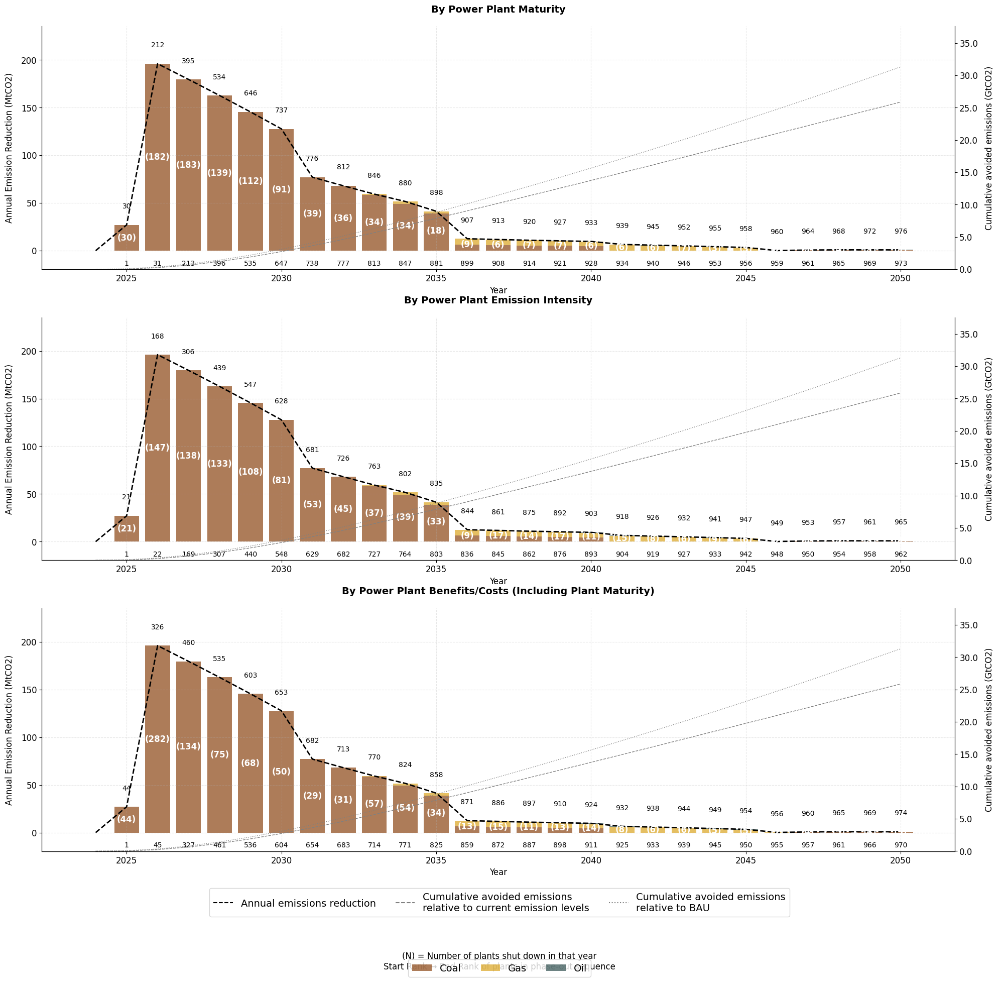

Displayed plot for India

Processing Indonesia...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


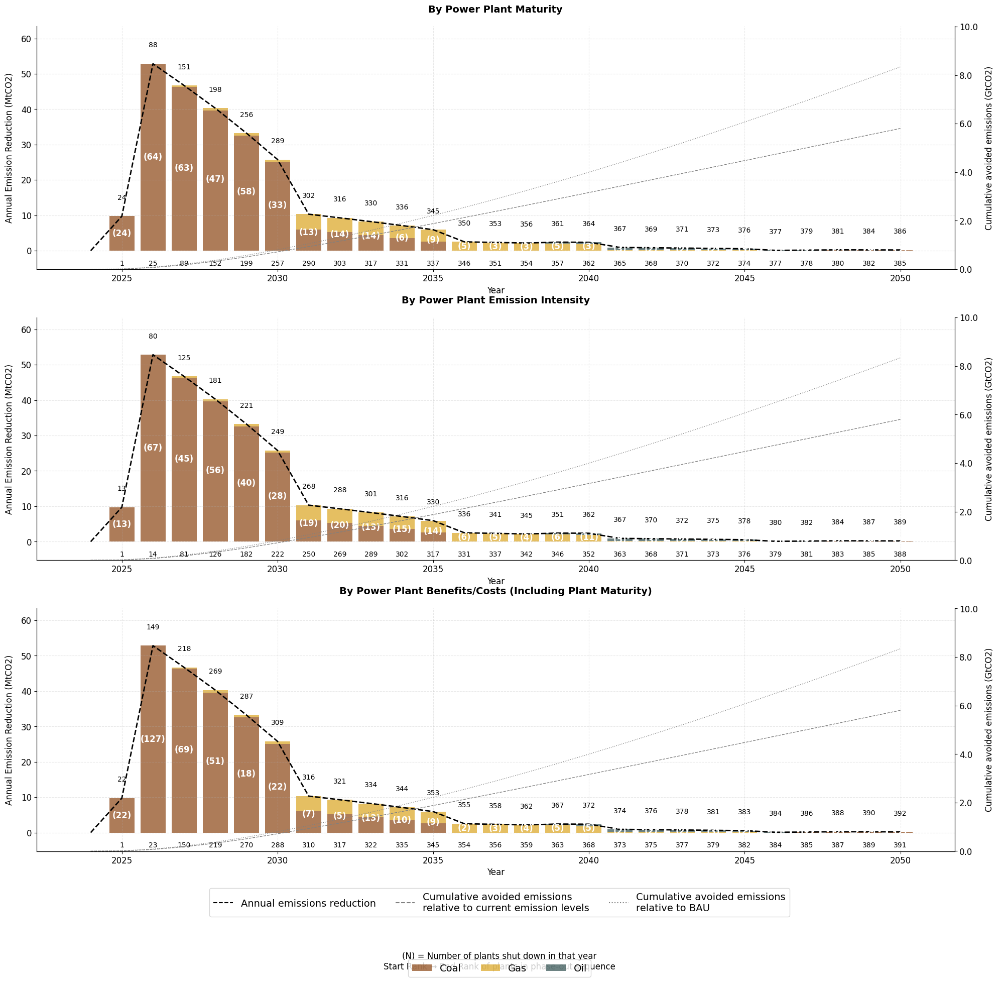

Displayed plot for Indonesia

Processing South Africa...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


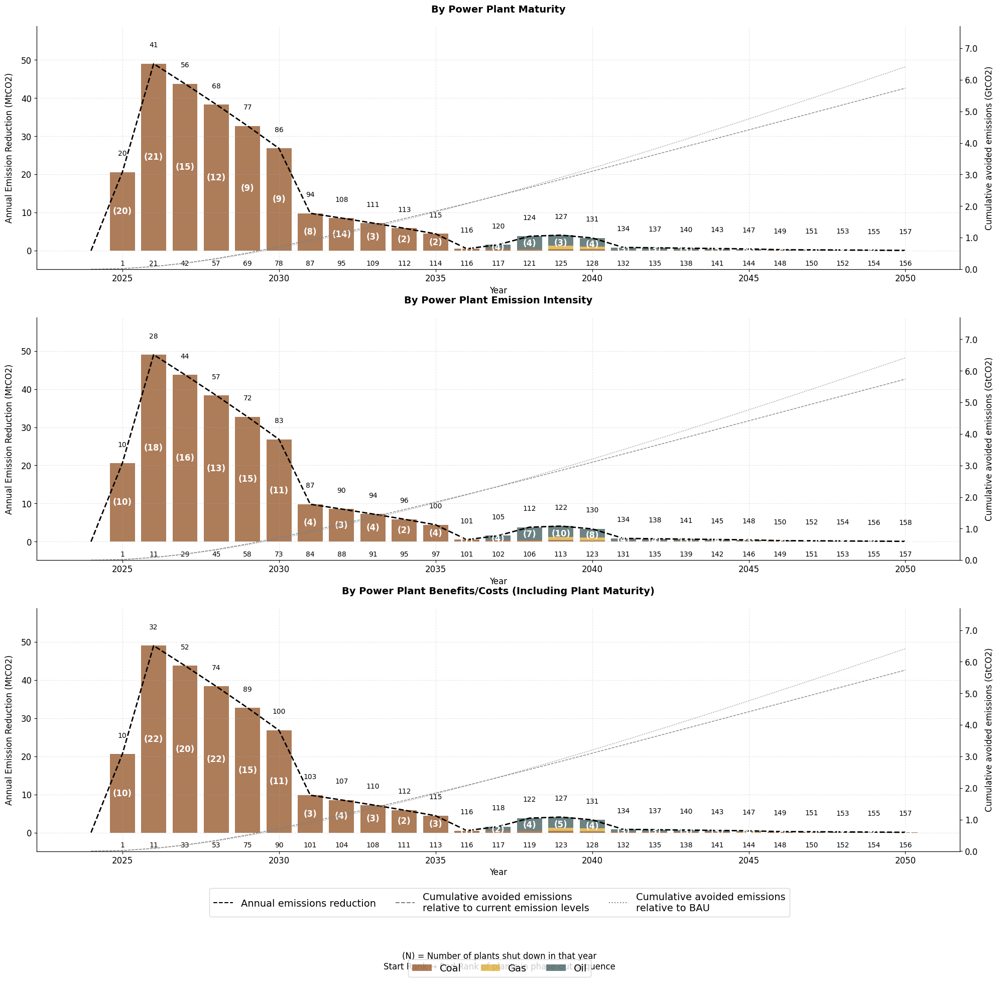

Displayed plot for South Africa

Processing Mexico...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


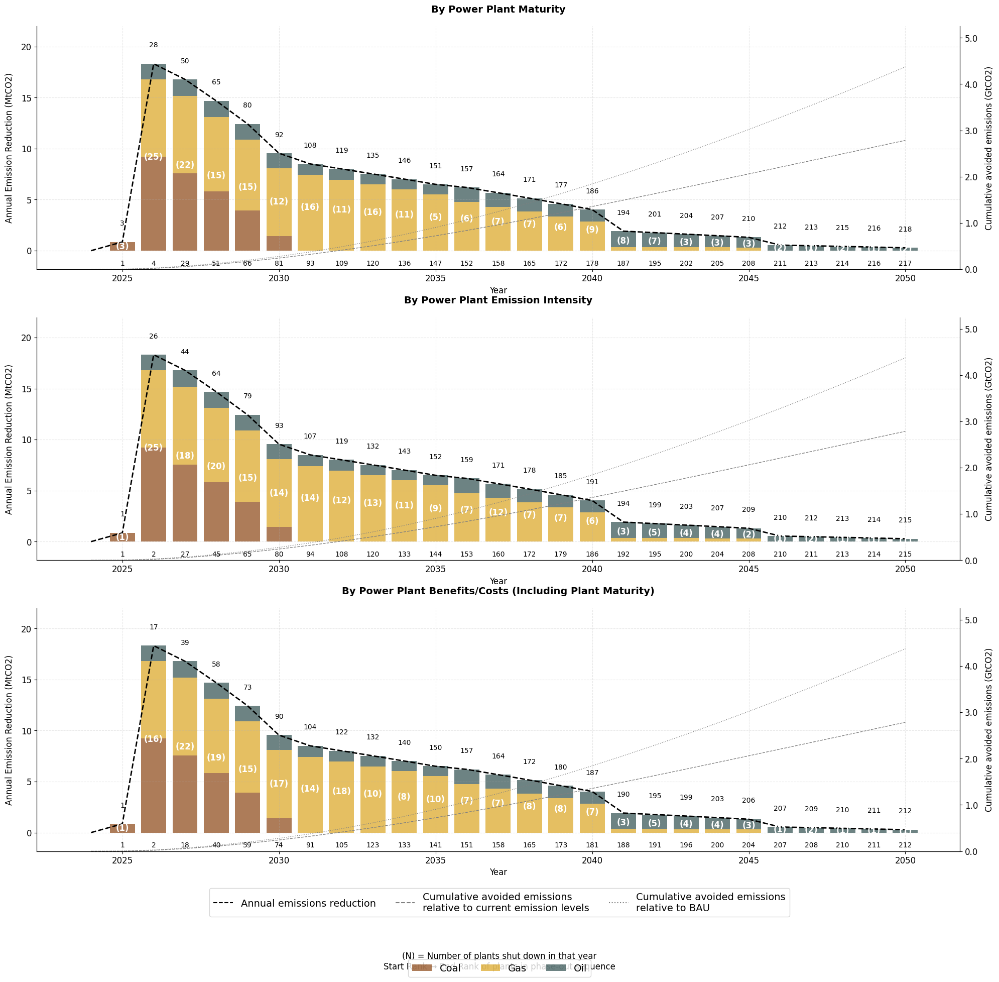

Displayed plot for Mexico

Processing Vietnam...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


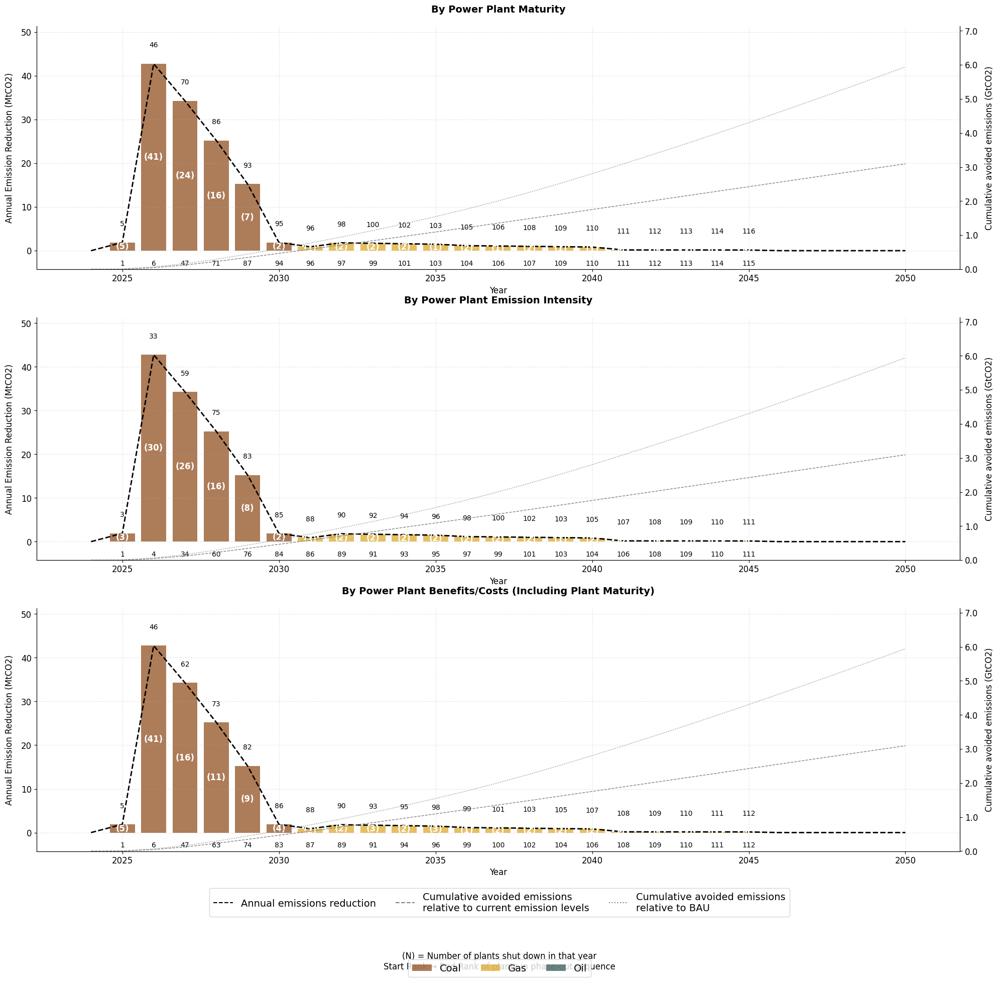

Displayed plot for Vietnam

Processing Iran...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


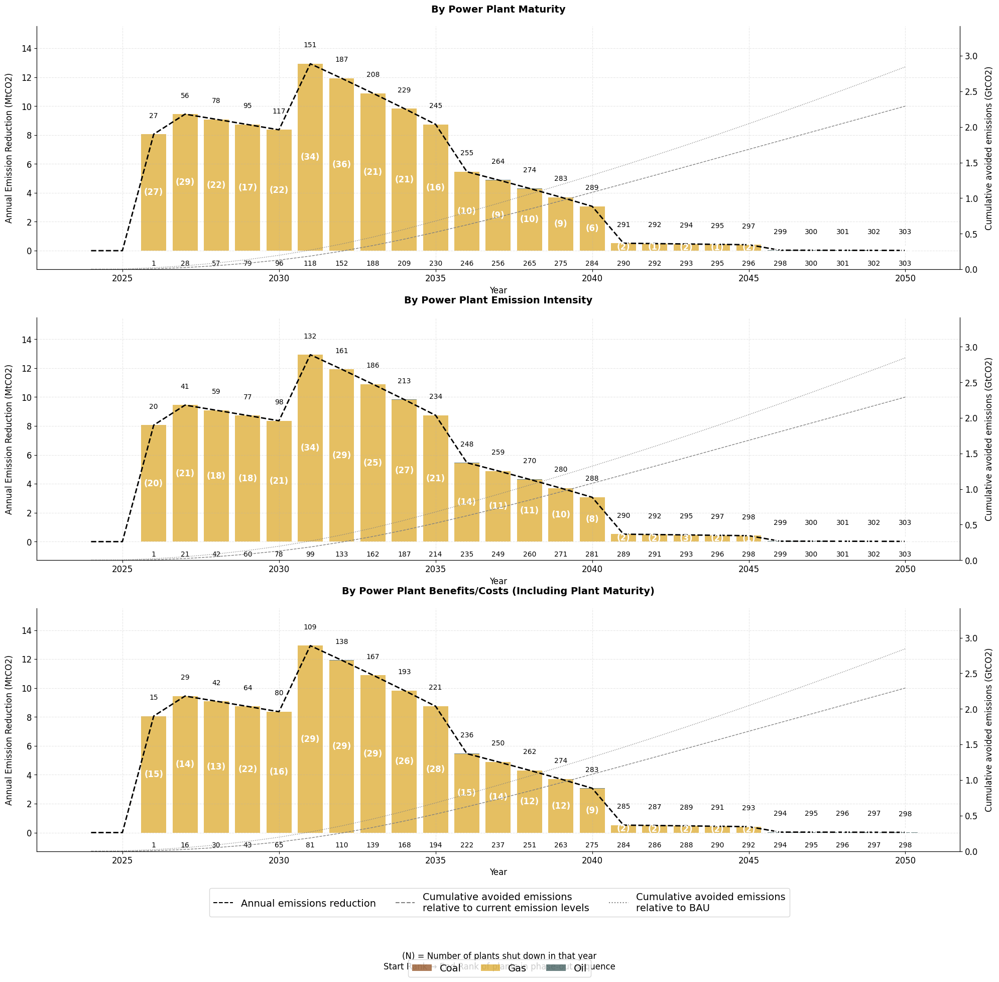

Displayed plot for Iran

Processing Thailand...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


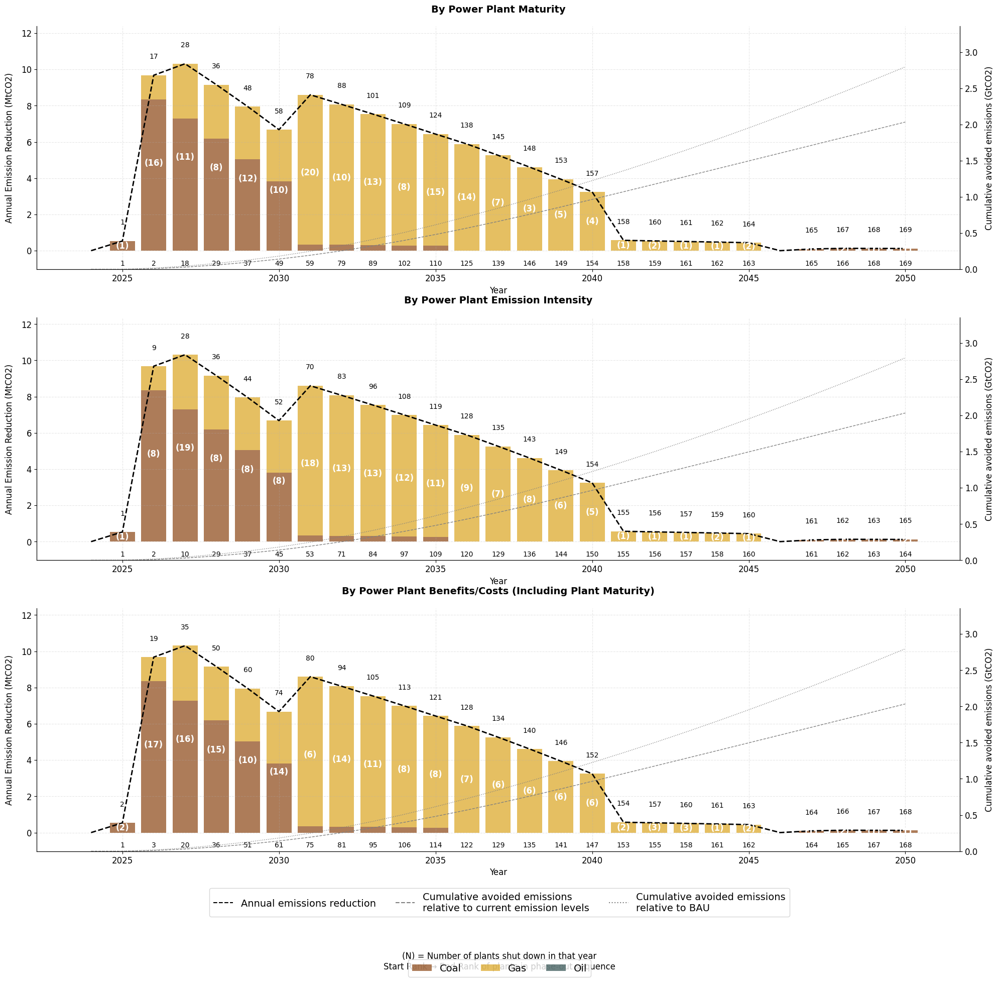

Displayed plot for Thailand

Processing Egypt...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


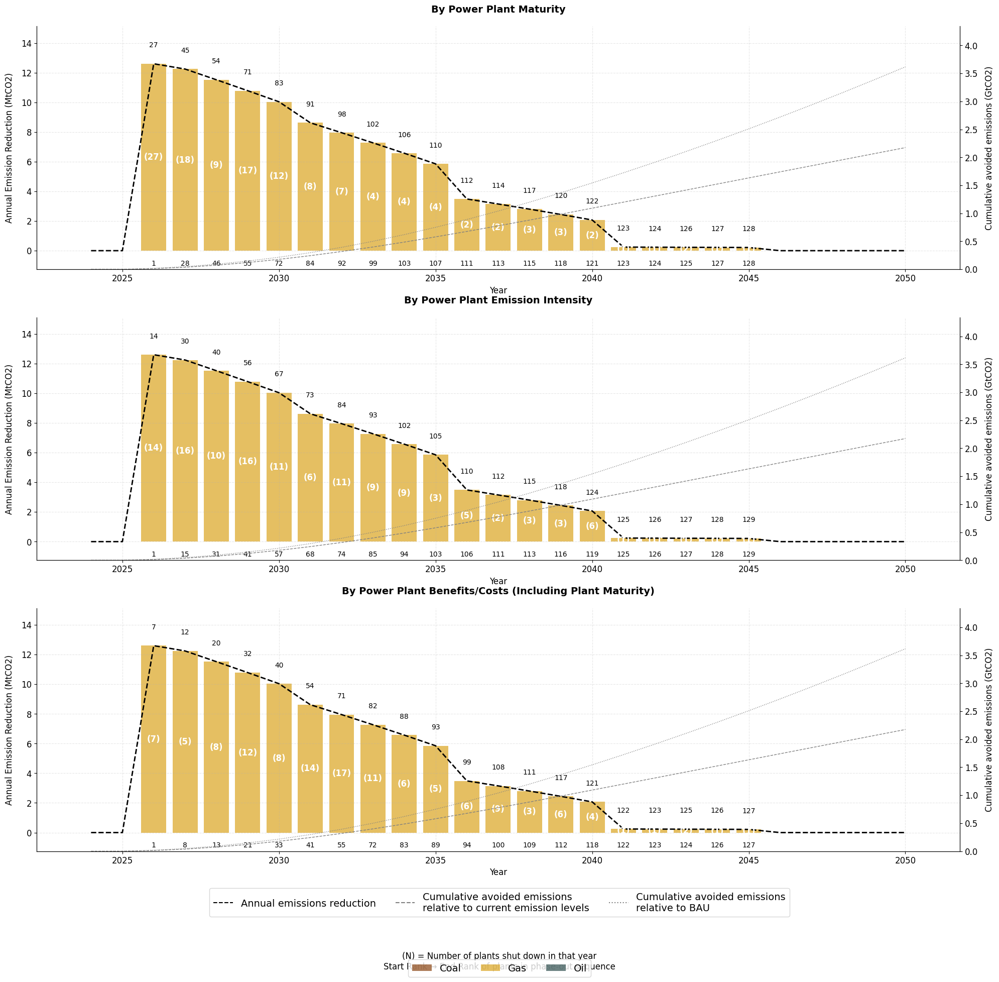

Displayed plot for Egypt

Processing Türkiye...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


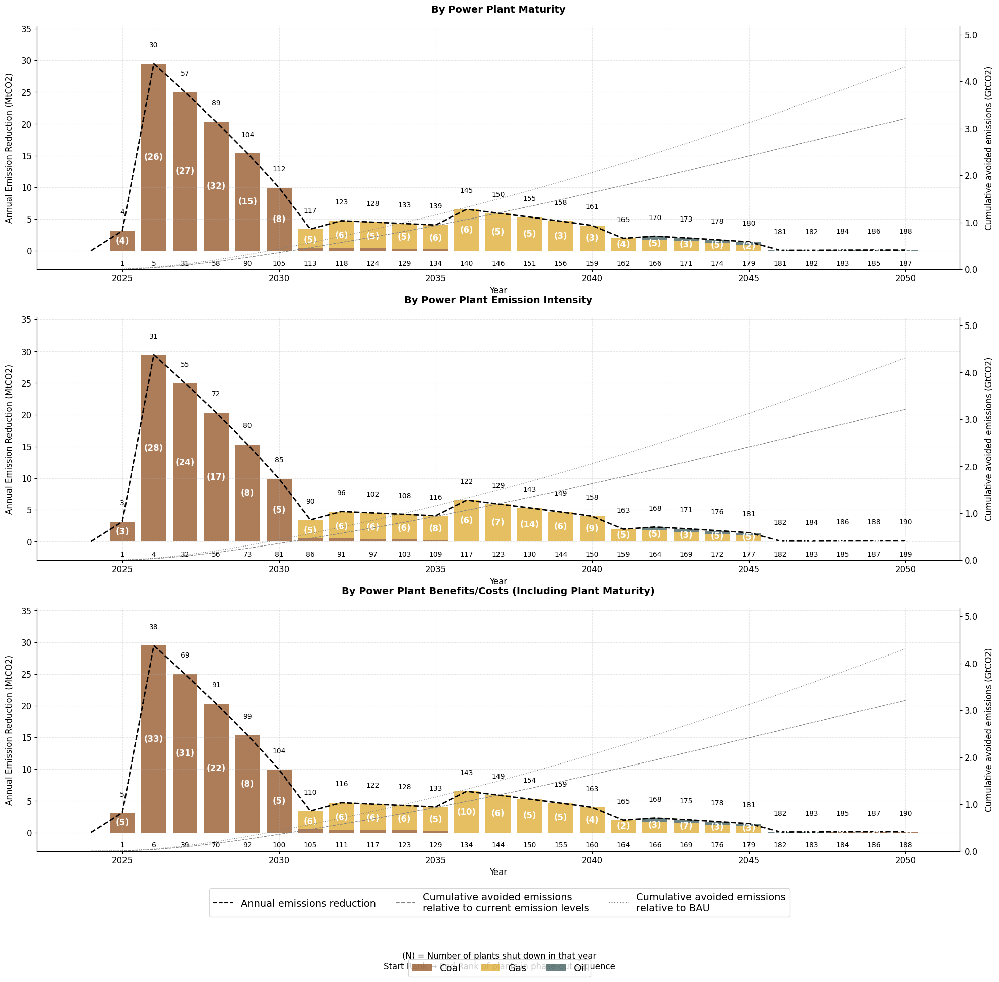

Displayed plot for Türkiye

Processing Bangladesh...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/861470690.py:176: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])


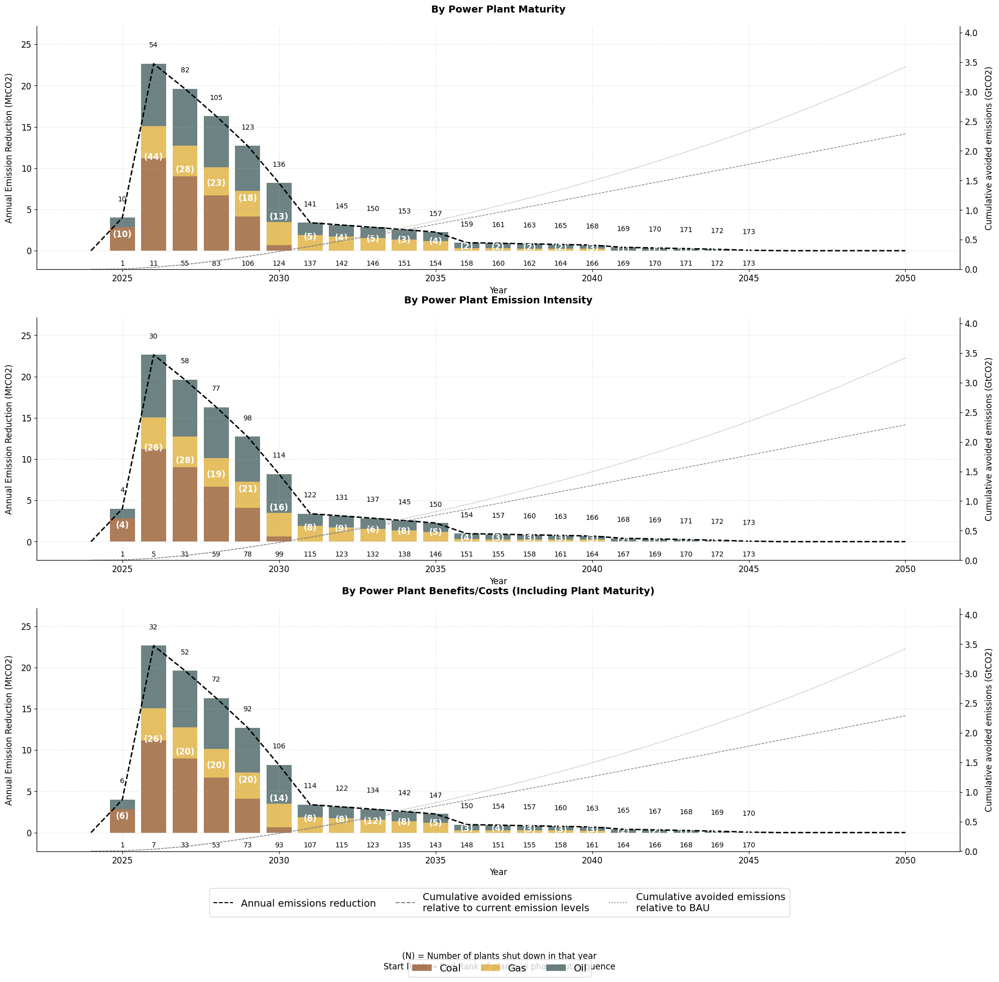

Displayed plot for Bangladesh


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def load_scenario_data(path):
    df = pd.read_csv(path)
    year_cols = [str(year) for year in range(2024, 2051)]
    
    scenario_data = {}
    for country in df['Region'].unique():
        country_data = df[df['Region'] == country]
        yearly_totals = {}
        
        for year in year_cols:
            year_total = country_data[year].sum()
            yearly_totals[int(year)] = year_total
                
        scenario_data[country] = yearly_totals
    
    return scenario_data

def load_and_process_data(base_path, country_code):
    files = {
        'maturity': f'v2_power_plant_phaseout_order_by_maturity_{country_code}_2050.csv',
        'emission_factor': f'v2_power_plant_phaseout_order_by_emission_factor_{country_code}_2050.csv',
        # Removed the benefits_cost entry
        'benefits_cost_maturity': f'v2_power_plant_phaseout_order_by_emissions_per_OC_maturity_{country_code}_2050.csv'
    }
    
    dfs = {}
    for key, filename in files.items():
        file_path = Path(base_path) / filename
        df = pd.read_csv(file_path)
        
        annual_data = []
        current_rank = 1
        cumulative_emissions = 0
        
        available_years = sorted(df['year'].unique())
        all_years = list(range(2024, 2051))
        
        for year in all_years:
            if year in available_years:
                year_plants = df[df['year'] == year]
                n_plants = len(year_plants)
                year_emissions = year_plants['amount_mtco2'].sum()
                cumulative_emissions += year_emissions
                
                # Create default dictionary for subsectors
                subsector_dict = {'Coal': 0, 'Gas': 0, 'Oil': 0}
                # Update with actual values
                for subsector, amount in year_plants.groupby('subsector')['amount_mtco2'].sum().to_dict().items():
                    subsector_dict[subsector] = amount
                
                annual_data.append({
                    'year': year,
                    'amount_mtco2': year_emissions,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank + n_plants - 1,
                    'n_plants': n_plants,
                    'plants_by_subsector': subsector_dict
                })
                current_rank += n_plants
            else:
                annual_data.append({
                    'year': year,
                    'amount_mtco2': 0,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank,
                    'n_plants': 0,
                    'plants_by_subsector': {'Coal': 0, 'Gas': 0, 'Oil': 0}
                })
        
        dfs[key] = pd.DataFrame(annual_data)
    
    return dfs

def create_visualization(country_code, country_name, base_path, bau_data, scenario_data):
    dfs = load_and_process_data(base_path, country_code)
    
    # Adjusted to 3 subplots instead of 4 since we removed one entry
    fig, axes = plt.subplots(3, 1, figsize=(20, 20))
    
    titles = {
        'maturity': 'By Power Plant Maturity',
        'emission_factor': 'By Power Plant Emission Intensity',
        # Removed the benefits_cost entry
        'benefits_cost_maturity': 'By Power Plant Benefits/Costs (Including Plant Maturity)'
    }
    
    colors = {'Coal': '#8B4513', 'Gas': '#DAA520', 'Oil': '#2F4F4F'}
    
    # Removed country name from title
    
    fuel_patches = [plt.Rectangle((0,0), 1, 1, facecolor=colors[fuel], alpha=0.7) 
                   for fuel in ['Coal', 'Gas', 'Oil']]
    
    line_patches = [
        plt.Line2D([0], [0], color='black', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle=':')
    ]
    
    # Moved legends to the bottom
    fig.text(0.5, 0.05, '(N) = Number of plants shut down in that year\nStart Rank → End Rank of plants in phase-out sequence',
             fontsize=12, ha='center', va='top',
             bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    for idx, (key, df) in enumerate(dfs.items()):
        ax = axes[idx]
        ax2 = ax.twinx()
        
        years = list(range(2024, 2051))
        max_emissions = df['amount_mtco2'].max()
        min_val = -max_emissions*0.1
        
        annual_totals = df['amount_mtco2'].values
        ax.plot(years, annual_totals, 'k--', linewidth=2)
        
        for i, row in df.iterrows():
            bottom = 0
            for subsector, amount in row['plants_by_subsector'].items():
                ax.bar(row['year'], amount, bottom=bottom, 
                      color=colors[subsector], alpha=0.7)
                bottom += amount
            
            total_height = sum(row['plants_by_subsector'].values())
            
            if total_height > 0:
                ax.text(row['year'], min_val*0.5,
                       f'{row["start_rank"]}', 
                       ha='center', va='top',
                       fontsize=10)
                ax.text(row['year'], total_height + max_emissions*0.08, 
                       f'{row["end_rank"]}', 
                       ha='center', va='bottom',
                       fontsize=10)
                ax.text(row['year'], total_height/2, 
                       f'({row["n_plants"]})',
                       ha='center', va='center', 
                       color='white', 
                       fontweight='bold', fontsize=12)
        
        # Calculate cumulative difference from 2024 levels for scenario pathway
        cumulative_from_2024 = []
        for year in years:
            if year == 2024:
                cumulative_from_2024.append(0)
            else:
                total_diff = sum(scenario_data[2024] - scenario_data[y] for y in range(2024, year + 1))
                cumulative_from_2024.append(total_diff)
        
        # Calculate cumulative BAU vs scenario difference
        cumulative_bau_scenario = []
        for year in years:
            if year == 2024:
                cumulative_bau_scenario.append(0)
            else:
                bau_sum = sum(bau_data[y] for y in range(2024, year + 1))
                scenario_sum = sum(scenario_data[y] for y in range(2024, year + 1))
                year_difference = (bau_sum - scenario_sum)
                cumulative_bau_scenario.append(year_difference)
        
        ax2.plot(years, cumulative_from_2024, color='grey', linestyle='--', linewidth=1)
        ax2.plot(years, cumulative_bau_scenario, color='grey', linestyle=':', linewidth=1)
        
        ax.set_title(titles[key], pad=20, fontsize=14, fontweight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Annual Emission Reduction (MtCO2)', fontsize=12, labelpad=10)
        ax2.set_ylabel('Cumulative avoided emissions (GtCO2)', fontsize=12, labelpad=10)
        
        y2_ticks = ax2.get_yticks()
        ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
        
        max_cumulative = max(max(cumulative_from_2024), max(cumulative_bau_scenario))
        
        ax.set_ylim(min_val, max_emissions*1.2)
        ax2.set_ylim(min_val, max_cumulative*1.2)
        
        ax.tick_params(axis='both', labelsize=12)
        ax2.tick_params(axis='both', labelsize=12)
        
        ax.set_xticks(np.arange(2025, 2055, 5))
        ax.set_xticklabels([str(year) for year in range(2025, 2055, 5)])
        
        ax.spines['top'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        
        ax.grid(True, alpha=0.3, linestyle='--')
    
    # Moved legends to bottom
    fig.legend(fuel_patches, ['Coal', 'Gas', 'Oil'],
              loc='lower center', bbox_to_anchor=(0.5, 0.02), ncol=3, fontsize=14)
    
    fig.legend(line_patches, 
              ['Annual emissions reduction',
               'Cumulative avoided emissions\nrelative to current emission levels',
               'Cumulative avoided emissions\nrelative to BAU'],
              loc='lower center', bbox_to_anchor=(0.5, 0.08), ncol=3, fontsize=14)
    
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15) # Adjusted to make room for legends at bottom
    return fig

# Main execution
base_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data"
bau_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/annual BAU .csv"
scenario_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/Annual 1.5 50.csv"
    
# ISO code mapping
iso_mapping = {
    'IN': 'IND', 'ID': 'IDN', 'ZA': 'ZAF', 'MX': 'MEX', 
    'VN': 'VNM', 'IR': 'IRN', 'TH': 'THA', 'EG': 'EGY', 
    'TR': 'TUR', 'BD': 'BGD'
}

# Load scenario data
bau_processed = load_scenario_data(bau_path)
scenario_processed = load_scenario_data(scenario_path)

# Country information
countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG', 'TR', 'BD']
country_names = {
    'IN': 'India', 'ID': 'Indonesia', 'ZA': 'South Africa',
    'MX': 'Mexico', 'VN': 'Vietnam', 'IR': 'Iran', 
    'TH': 'Thailand', 'EG': 'Egypt', 'TR': 'Türkiye', 
    'BD': 'Bangladesh'
}

# Create and show visualizations for all countries
for country in countries:
    print(f"\nProcessing {country_names[country]}...")
    fig = create_visualization(
        country, 
        country_names[country], 
        base_path, 
        bau_processed[iso_mapping[country]],
        scenario_processed[iso_mapping[country]]
    )
    plt.show()
    print(f"Displayed plot for {country_names[country]}")


Processing India...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

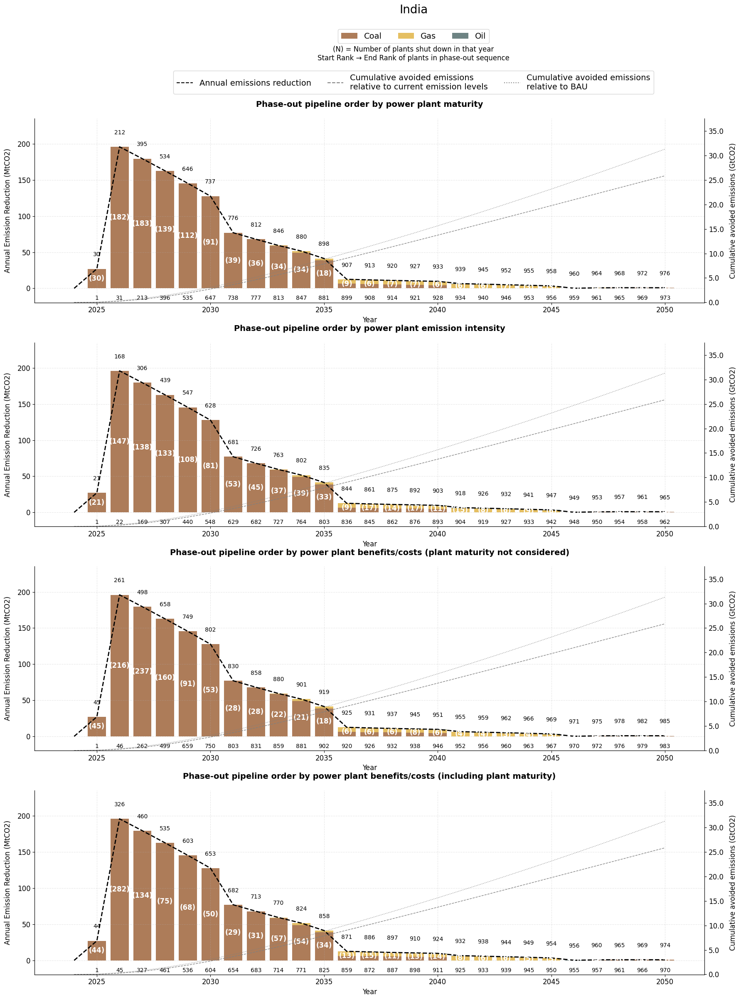

Displayed plot for India

Processing Indonesia...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

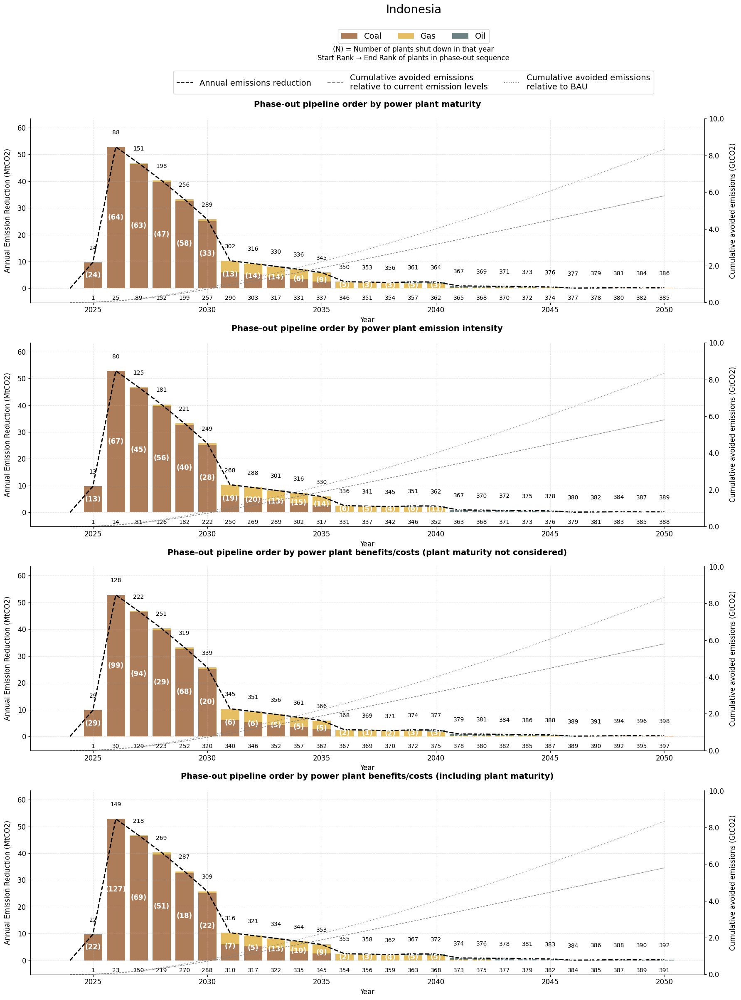

Displayed plot for Indonesia

Processing South Africa...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

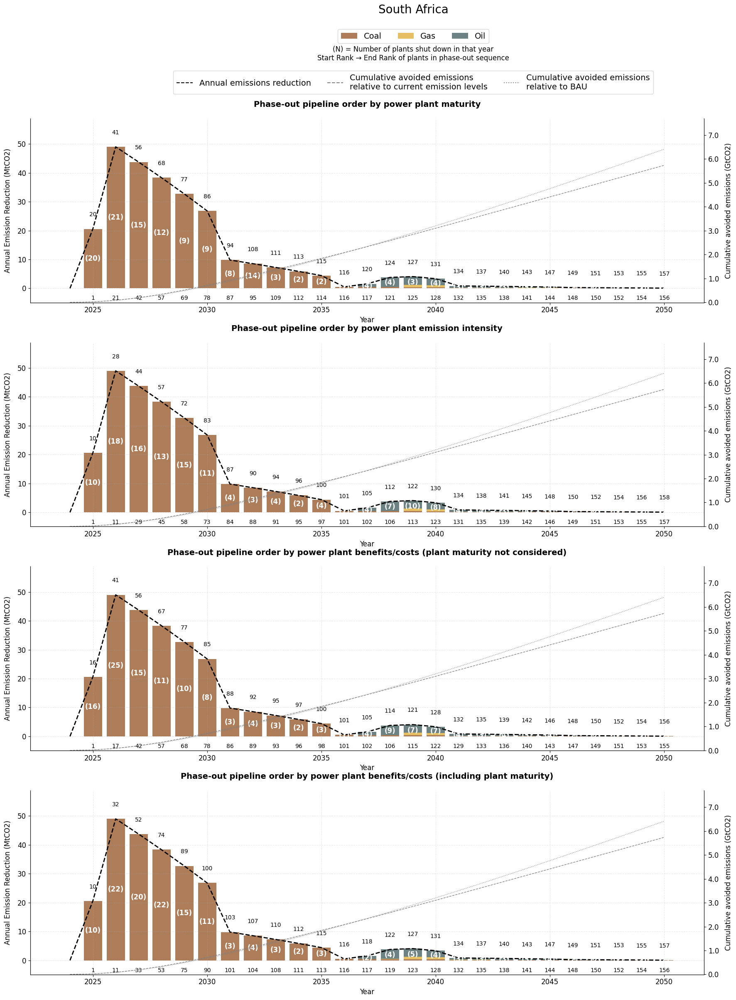

Displayed plot for South Africa

Processing Mexico...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

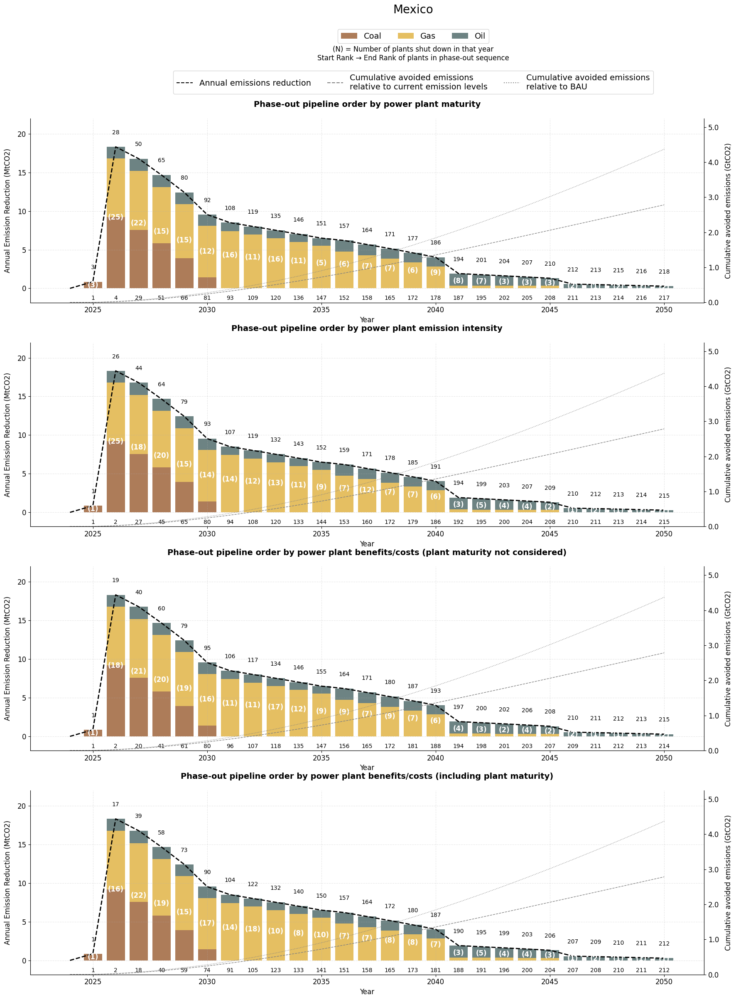

Displayed plot for Mexico

Processing Vietnam...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

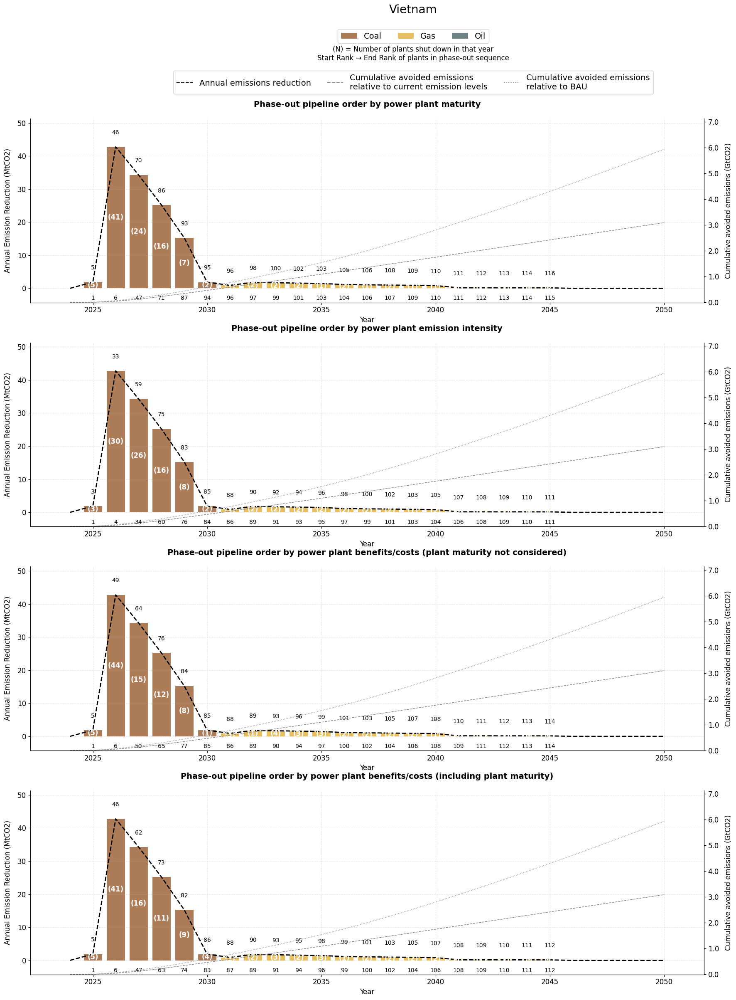

Displayed plot for Vietnam

Processing Iran...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

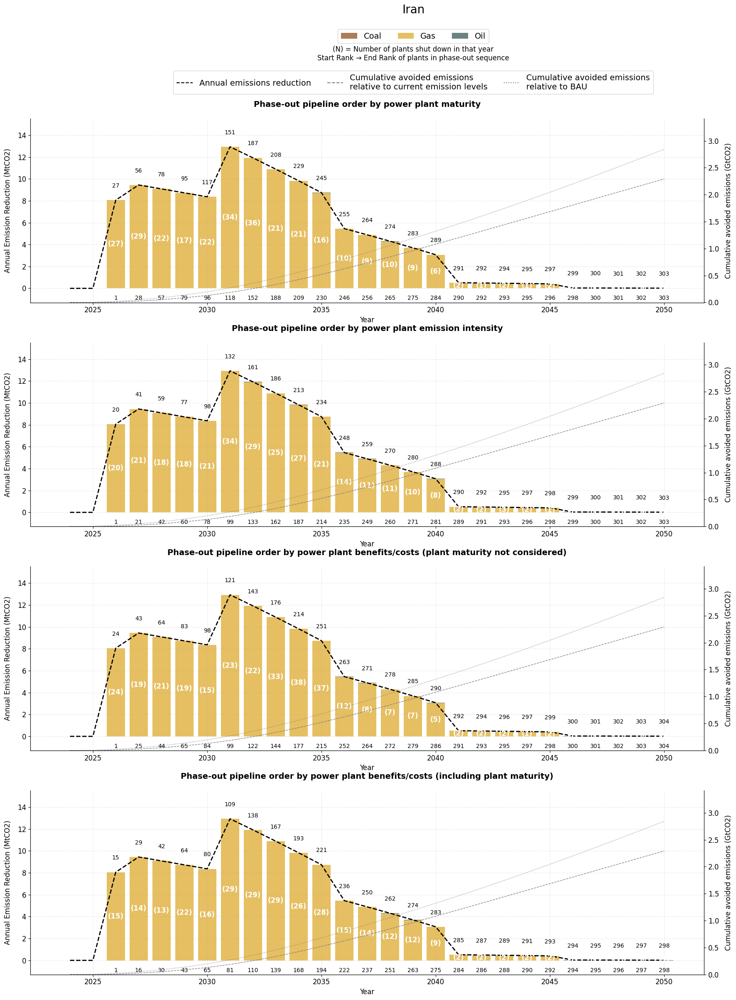

Displayed plot for Iran

Processing Thailand...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

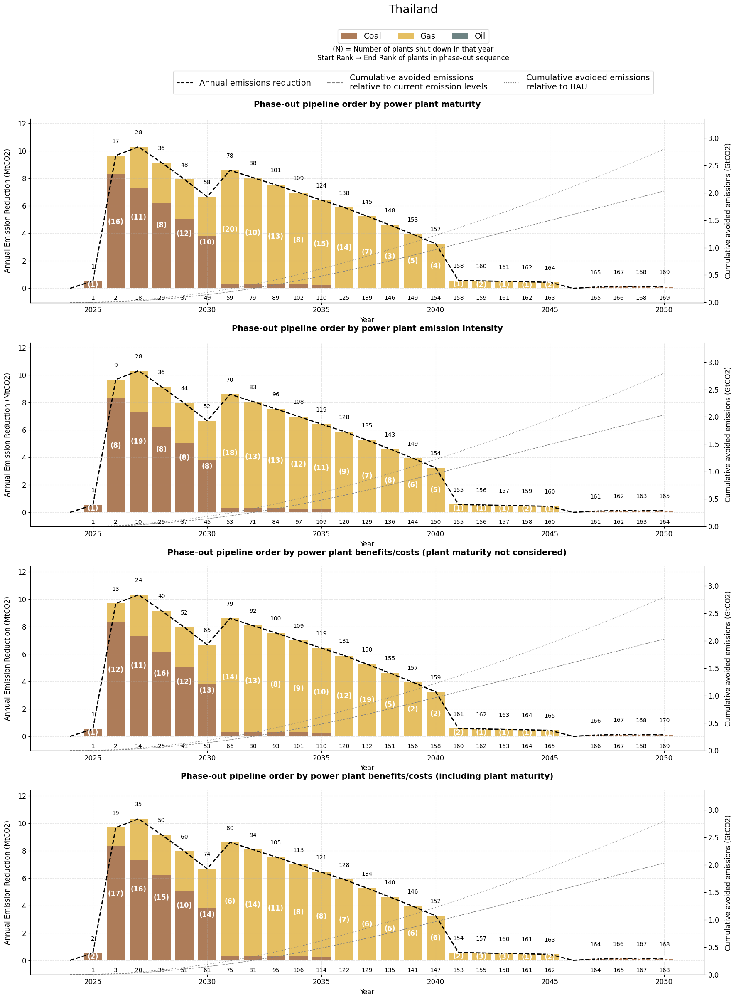

Displayed plot for Thailand

Processing Egypt...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

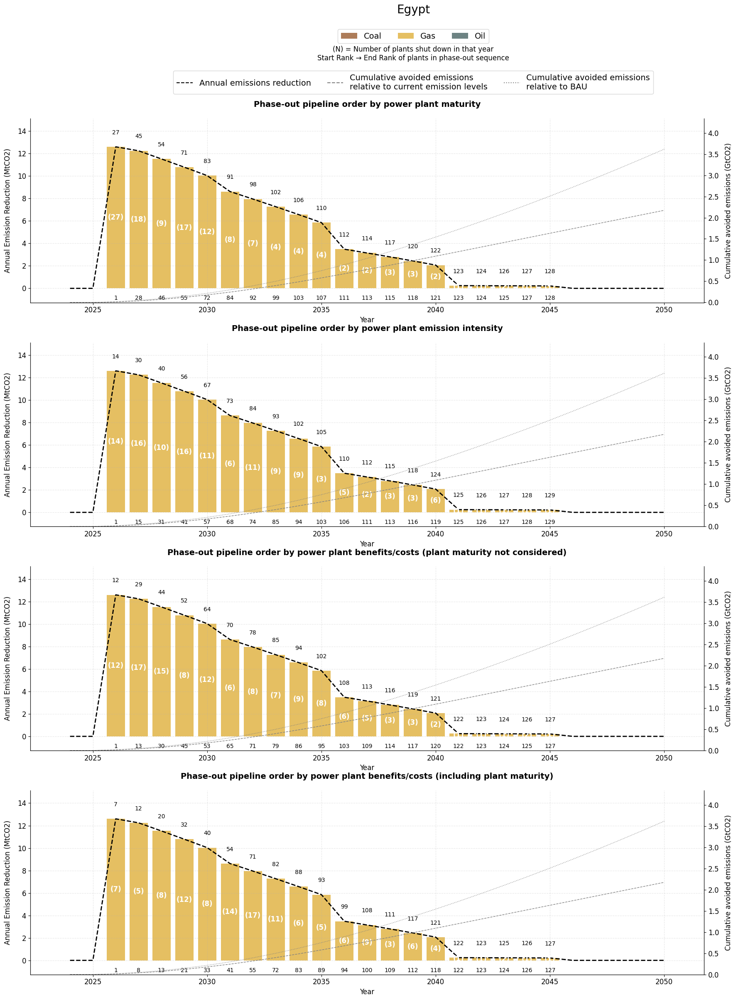

Displayed plot for Egypt

Processing Türkiye...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

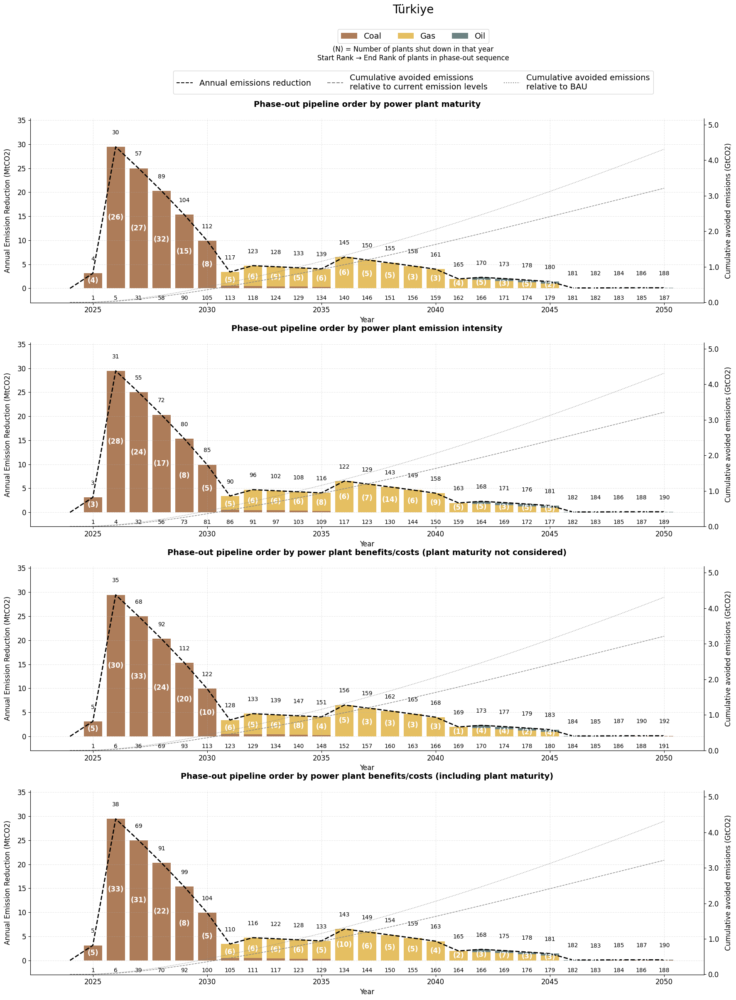

Displayed plot for Türkiye

Processing Bangladesh...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/3144221260.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

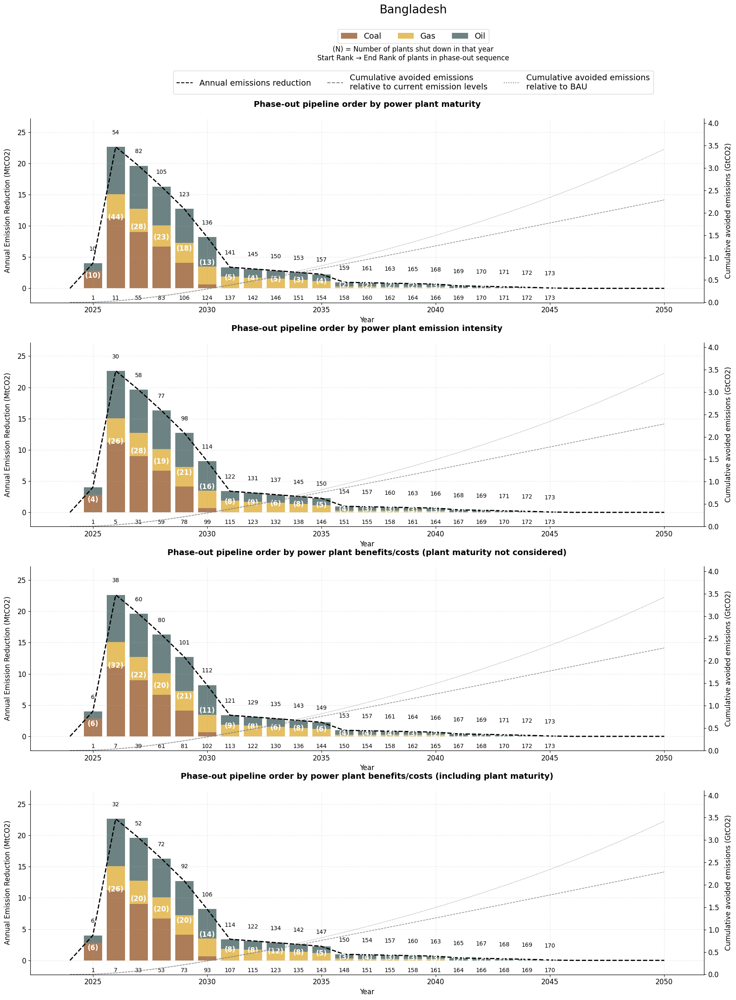

Displayed plot for Bangladesh


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def load_scenario_data(path):
    df = pd.read_csv(path)
    year_cols = [str(year) for year in range(2024, 2051)]
    
    scenario_data = {}
    for country in df['Region'].unique():
        country_data = df[df['Region'] == country]
        yearly_totals = {}
        
        for year in year_cols:
            year_total = country_data[year].sum()
            yearly_totals[int(year)] = year_total
                
        scenario_data[country] = yearly_totals
    
    return scenario_data

def load_and_process_data(base_path, country_code):
    files = {
        'maturity': f'v2_power_plant_phaseout_order_by_maturity_{country_code}_2050.csv',
        'emission_factor': f'v2_power_plant_phaseout_order_by_emission_factor_{country_code}_2050.csv',
        'benefits_cost': f'v2_power_plant_phaseout_order_by_emissions_per_opportunity_cost_projection_{country_code}_2050.csv',
        'benefits_cost_maturity': f'v2_power_plant_phaseout_order_by_emissions_per_OC_maturity_{country_code}_2050.csv'
    }
    
    dfs = {}
    for key, filename in files.items():
        file_path = Path(base_path) / filename
        df = pd.read_csv(file_path)
        
        annual_data = []
        current_rank = 1
        cumulative_emissions = 0
        
        available_years = sorted(df['year'].unique())
        all_years = list(range(2024, 2051))
        
        for year in all_years:
            if year in available_years:
                year_plants = df[df['year'] == year]
                n_plants = len(year_plants)
                year_emissions = year_plants['amount_mtco2'].sum()
                cumulative_emissions += year_emissions
                
                # Create default dictionary for subsectors
                subsector_dict = {'Coal': 0, 'Gas': 0, 'Oil': 0}
                # Update with actual values
                for subsector, amount in year_plants.groupby('subsector')['amount_mtco2'].sum().to_dict().items():
                    subsector_dict[subsector] = amount
                
                annual_data.append({
                    'year': year,
                    'amount_mtco2': year_emissions,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank + n_plants - 1,
                    'n_plants': n_plants,
                    'plants_by_subsector': subsector_dict
                })
                current_rank += n_plants
            else:
                annual_data.append({
                    'year': year,
                    'amount_mtco2': 0,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank,
                    'n_plants': 0,
                    'plants_by_subsector': {'Coal': 0, 'Gas': 0, 'Oil': 0}
                })
        
        dfs[key] = pd.DataFrame(annual_data)
    
    return dfs

def create_visualization(country_code, country_name, base_path, bau_data, scenario_data):
    dfs = load_and_process_data(base_path, country_code)
    
    fig, axes = plt.subplots(4, 1, figsize=(20, 25))
    
    titles = {
        'maturity': 'Phase-out pipeline order by power plant maturity',
        'emission_factor': 'Phase-out pipeline order by power plant emission intensity',
        'benefits_cost': 'Phase-out pipeline order by power plant benefits/costs (plant maturity not considered)',
        'benefits_cost_maturity': 'Phase-out pipeline order by power plant benefits/costs (including plant maturity)'
    }
    
    colors = {'Coal': '#8B4513', 'Gas': '#DAA520', 'Oil': '#2F4F4F'}
    
    fig.suptitle(country_name, fontsize=20, y=0.96)
    
    fuel_patches = [plt.Rectangle((0,0), 1, 1, facecolor=colors[fuel], alpha=0.7) 
                   for fuel in ['Coal', 'Gas', 'Oil']]
    
    line_patches = [
        plt.Line2D([0], [0], color='black', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle=':')
    ]
    
    fig.legend(fuel_patches, ['Coal', 'Gas', 'Oil'],
              loc='upper center', bbox_to_anchor=(0.5, 0.94), ncol=3, fontsize=14)
    
    fig.text(0.5, 0.92, '(N) = Number of plants shut down in that year\nStart Rank → End Rank of plants in phase-out sequence',
             fontsize=12, ha='center', va='top',
             bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    fig.legend(line_patches, 
              ['Annual emissions reduction',
               'Cumulative avoided emissions\nrelative to current emission levels',
               'Cumulative avoided emissions\nrelative to BAU'],
              loc='upper center', bbox_to_anchor=(0.5, 0.9), ncol=5, fontsize=14)
    
    for idx, (key, df) in enumerate(dfs.items()):
        ax = axes[idx]
        ax2 = ax.twinx()
        
        years = list(range(2024, 2051))
        max_emissions = df['amount_mtco2'].max()
        min_val = -max_emissions*0.1
        
        annual_totals = df['amount_mtco2'].values
        ax.plot(years, annual_totals, 'k--', linewidth=2)
        
        for i, row in df.iterrows():
            bottom = 0
            for subsector, amount in row['plants_by_subsector'].items():
                ax.bar(row['year'], amount, bottom=bottom, 
                      color=colors[subsector], alpha=0.7)
                bottom += amount
            
            total_height = sum(row['plants_by_subsector'].values())
            
            if total_height > 0:
                ax.text(row['year'], min_val*0.5,
                       f'{row["start_rank"]}', 
                       ha='center', va='top',
                       fontsize=10)
                ax.text(row['year'], total_height + max_emissions*0.08, 
                       f'{row["end_rank"]}', 
                       ha='center', va='bottom',
                       fontsize=10)
                ax.text(row['year'], total_height/2, 
                       f'({row["n_plants"]})',
                       ha='center', va='center', 
                       color='white', 
                       fontweight='bold', fontsize=12)
        
        # Calculate cumulative difference from 2024 levels for scenario pathway
        cumulative_from_2024 = []
        for year in years:
            if year == 2024:
                cumulative_from_2024.append(0)
            else:
                total_diff = sum(scenario_data[2024] - scenario_data[y] for y in range(2024, year + 1))
                cumulative_from_2024.append(total_diff)
        
        # Calculate cumulative BAU vs scenario difference
        cumulative_bau_scenario = []
        for year in years:
            if year == 2024:
                cumulative_bau_scenario.append(0)
            else:
                bau_sum = sum(bau_data[y] for y in range(2024, year + 1))
                scenario_sum = sum(scenario_data[y] for y in range(2024, year + 1))
                year_difference = (bau_sum - scenario_sum)
                cumulative_bau_scenario.append(year_difference)
        
        ax2.plot(years, cumulative_from_2024, color='grey', linestyle='--', linewidth=1)
        ax2.plot(years, cumulative_bau_scenario, color='grey', linestyle=':', linewidth=1)
        
        ax.set_title(titles[key], pad=20, fontsize=14, fontweight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Annual Emission Reduction (MtCO2)', fontsize=12, labelpad=10)
        ax2.set_ylabel('Cumulative avoided emissions (GtCO2)', fontsize=12, labelpad=10)
        
        y2_ticks = ax2.get_yticks()
        ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
        
        max_cumulative = max(max(cumulative_from_2024), max(cumulative_bau_scenario))
        
        ax.set_ylim(min_val, max_emissions*1.2)
        ax2.set_ylim(min_val, max_cumulative*1.2)
        
        ax.tick_params(axis='both', labelsize=12)
        ax2.tick_params(axis='both', labelsize=12)
        
        ax.set_xticks(np.arange(2025, 2055, 5))
        ax.set_xticklabels([str(year) for year in range(2025, 2055, 5)])
        
        ax.spines['top'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        
        ax.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85, right=0.85)
    return fig

# Main execution
base_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data"
bau_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/annual BAU .csv"
scenario_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/Annual 1.5 50.csv"
    
# ISO code mapping
iso_mapping = {
    'IN': 'IND', 'ID': 'IDN', 'ZA': 'ZAF', 'MX': 'MEX', 
    'VN': 'VNM', 'IR': 'IRN', 'TH': 'THA', 'EG': 'EGY', 
    'TR': 'TUR', 'BD': 'BGD'
}

# Load scenario data
bau_processed = load_scenario_data(bau_path)
scenario_processed = load_scenario_data(scenario_path)

# Country information
countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG', 'TR', 'BD']
country_names = {
    'IN': 'India', 'ID': 'Indonesia', 'ZA': 'South Africa',
    'MX': 'Mexico', 'VN': 'Vietnam', 'IR': 'Iran', 
    'TH': 'Thailand', 'EG': 'Egypt', 'TR': 'Türkiye', 
    'BD': 'Bangladesh'
}

# Create and show visualizations for all countries
for country in countries:
    print(f"\nProcessing {country_names[country]}...")
    fig = create_visualization(
        country, 
        country_names[country], 
        base_path, 
        bau_processed[iso_mapping[country]],
        scenario_processed[iso_mapping[country]]
    )
    plt.show()
    print(f"Displayed plot for {country_names[country]}")

This is my final code but I still dont understand why EG and BD are being saved in the wrong manner in the folders. 

/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. af

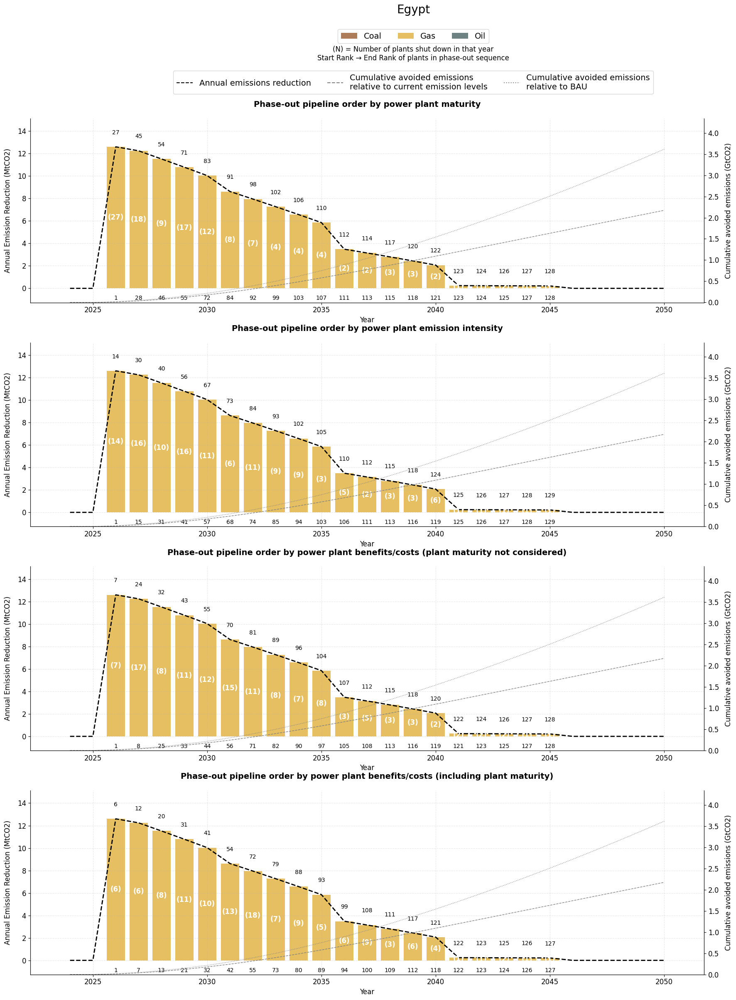

/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/212198940.py:180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. af

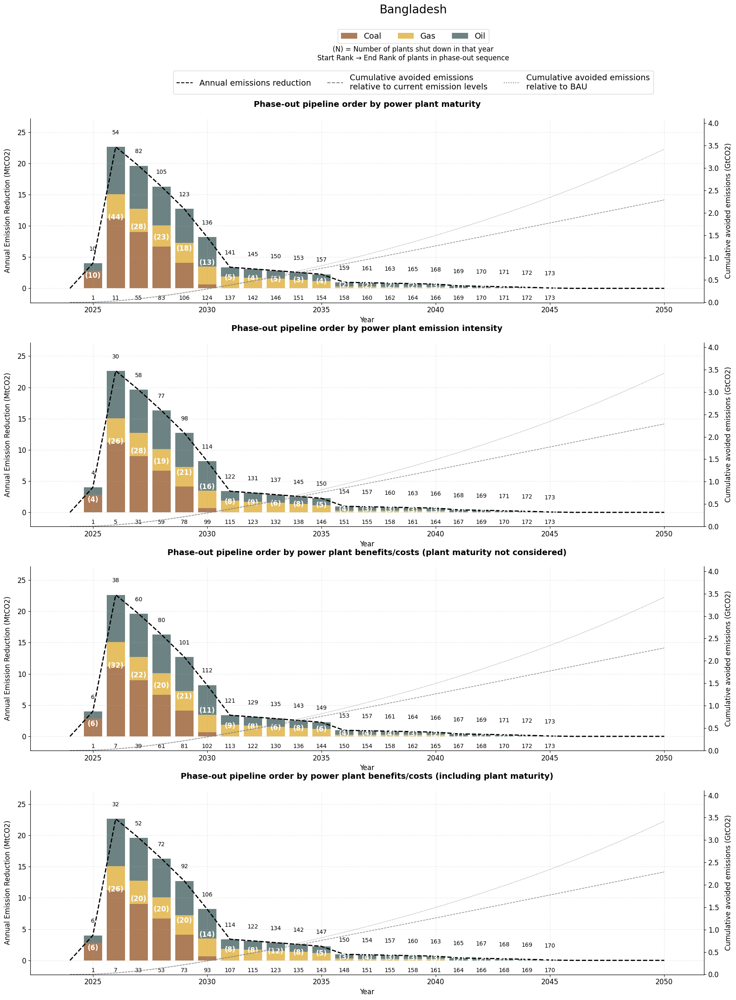

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def load_scenario_data(path):
    df = pd.read_csv(path)
    year_cols = [str(year) for year in range(2024, 2051)]
    
    scenario_data = {}
    for country in df['Region'].unique():
        country_data = df[df['Region'] == country]
        yearly_totals = {}
        
        for year in year_cols:
            year_total = country_data[year].sum()
            yearly_totals[int(year)] = year_total
                
        scenario_data[country] = yearly_totals
    
    return scenario_data

def load_and_process_data(base_path, country_code):
    files = {
        'maturity': f'v2_power_plant_phaseout_order_by_maturity_{country_code}_2050.csv',
        'emission_factor': f'v2_power_plant_phaseout_order_by_emission_factor_{country_code}_2050.csv',
        'benefits_cost': f'v2_power_plant_phaseout_order_by_emissions_per_opportunity_cost_projection_{country_code}_2050.csv',
        'benefits_cost_maturity': f'v2_power_plant_phaseout_order_by_emissions_per_OC_maturity_{country_code}_2050.csv'
    }
    
    dfs = {}
    for key, filename in files.items():
        file_path = Path(base_path) / filename
        df = pd.read_csv(file_path)
        
        annual_data = []
        current_rank = 1
        cumulative_emissions = 0
        
        available_years = sorted(df['year'].unique())
        all_years = list(range(2024, 2051))
        
        for year in all_years:
            if year in available_years:
                year_plants = df[df['year'] == year]
                n_plants = len(year_plants)
                year_emissions = year_plants['amount_mtco2'].sum()
                cumulative_emissions += year_emissions
                
                annual_data.append({
                    'year': year,
                    'amount_mtco2': year_emissions,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank + n_plants - 1,
                    'n_plants': n_plants,
                    'plants_by_subsector': year_plants.groupby('subsector')['amount_mtco2'].sum().to_dict()
                })
                current_rank += n_plants
            else:
                annual_data.append({
                    'year': year,
                    'amount_mtco2': 0,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank,
                    'n_plants': 0,
                    'plants_by_subsector': {'Coal': 0, 'Gas': 0, 'Oil': 0}
                })
        
        dfs[key] = pd.DataFrame(annual_data)
    
    return dfs

def create_visualization(country_code, country_name, base_path, bau_path, scenario_path):
    bau_data = load_scenario_data(bau_path)['EGY' if country_code == 'EG' else 'BGD']
    scenario_data = load_scenario_data(scenario_path)['EGY' if country_code == 'EG' else 'BGD']
    
    dfs = load_and_process_data(base_path, country_code)
    
    fig, axes = plt.subplots(4, 1, figsize=(20, 25))
    
    titles = {
        'maturity': 'Phase-out pipeline order by power plant maturity',
        'emission_factor': 'Phase-out pipeline order by power plant emission intensity',
        'benefits_cost': 'Phase-out pipeline order by power plant benefits/costs (plant maturity not considered)',
        'benefits_cost_maturity': 'Phase-out pipeline order by power plant benefits/costs (including plant maturity)'
    }
    
    colors = {'Coal': '#8B4513', 'Gas': '#DAA520', 'Oil': '#2F4F4F'}
    
    fig.suptitle(country_name, fontsize=20, y=0.96)
    
    fuel_patches = [plt.Rectangle((0,0), 1, 1, facecolor=colors[fuel], alpha=0.7) 
                   for fuel in ['Coal', 'Gas', 'Oil']]
    
    line_patches = [
        plt.Line2D([0], [0], color='black', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle=':')
    ]
    
    fig.legend(fuel_patches, ['Coal', 'Gas', 'Oil'],
              loc='upper center', bbox_to_anchor=(0.5, 0.94), ncol=3, fontsize=14)
    
    fig.text(0.5, 0.92, '(N) = Number of plants shut down in that year\nStart Rank → End Rank of plants in phase-out sequence',
             fontsize=12, ha='center', va='top',
             bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    fig.legend(line_patches, 
              ['Annual emissions reduction',
               'Cumulative avoided emissions\nrelative to current emission levels',
               'Cumulative avoided emissions\nrelative to BAU'],
              loc='upper center', bbox_to_anchor=(0.5, 0.9), ncol=5, fontsize=14)
    
    for idx, (key, df) in enumerate(dfs.items()):
        ax = axes[idx]
        ax2 = ax.twinx()
        
        years = list(range(2024, 2051))
        max_emissions = df['amount_mtco2'].max()
        min_val = -max_emissions*0.1
        
        annual_totals = df['amount_mtco2'].values
        ax.plot(years, annual_totals, 'k--', linewidth=2)
        
        for i, row in df.iterrows():
            bottom = 0
            for subsector, amount in row['plants_by_subsector'].items():
                ax.bar(row['year'], amount, bottom=bottom, 
                      color=colors[subsector], alpha=0.7)
                bottom += amount
            
            total_height = sum(row['plants_by_subsector'].values())
            
            if total_height > 0:
                ax.text(row['year'], min_val*0.5,
                       f'{row["start_rank"]}', 
                       ha='center', va='top',
                       fontsize=10)
                ax.text(row['year'], total_height + max_emissions*0.08, 
                       f'{row["end_rank"]}', 
                       ha='center', va='bottom',
                       fontsize=10)
                ax.text(row['year'], total_height/2, 
                       f'({row["n_plants"]})',
                       ha='center', va='center', 
                       color='white', 
                       fontweight='bold', fontsize=12)
        
        # Calculate cumulative difference from 2024 levels for scenario pathway
        cumulative_from_2024 = []
        for year in years:
            if year == 2024:
                cumulative_from_2024.append(0)
            else:
                total_diff = sum(scenario_data[2024] - scenario_data[y] for y in range(2024, year + 1))
                cumulative_from_2024.append(total_diff)
        
        # Calculate cumulative BAU vs scenario difference
        cumulative_bau_scenario = []
        for year in years:
            if year == 2024:
                cumulative_bau_scenario.append(0)
            else:
                bau_sum = sum(bau_data[y] for y in range(2024, year + 1))
                scenario_sum = sum(scenario_data[y] for y in range(2024, year + 1))
                year_difference = (bau_sum - scenario_sum)
                cumulative_bau_scenario.append(year_difference)
        
        ax2.plot(years, cumulative_from_2024, color='grey', linestyle='--', linewidth=1)
        ax2.plot(years, cumulative_bau_scenario, color='grey', linestyle=':', linewidth=1)
        
        ax.set_title(titles[key], pad=20, fontsize=14, fontweight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Annual Emission Reduction (MtCO2)', fontsize=12, labelpad=10)
        ax2.set_ylabel('Cumulative avoided emissions (GtCO2)', fontsize=12, labelpad=10)
        
        y2_ticks = ax2.get_yticks()
        ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
        
        max_cumulative = max(max(cumulative_from_2024), max(cumulative_bau_scenario))
        
        ax.set_ylim(min_val, max_emissions*1.2)
        ax2.set_ylim(min_val, max_cumulative*1.2)
        
        ax.tick_params(axis='both', labelsize=12)
        ax2.tick_params(axis='both', labelsize=12)
        
        ax.set_xticks(np.arange(2025, 2055, 5))
        ax.set_xticklabels([str(year) for year in range(2025, 2055, 5)])
        
        ax.spines['top'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        
        ax.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85, right=0.85)
    return fig

base_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data"
bau_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/annual BAU .csv"
scenario_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/Annual 1.5 50.csv"

fig_egypt = create_visualization('EG', 'Egypt', base_path, bau_path, scenario_path)
plt.show()

fig_bangladesh = create_visualization('BD', 'Bangladesh', base_path, bau_path, scenario_path)
plt.show()

### Final Grey Lines

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

def load_scenario_data(path):
    df = pd.read_csv(path)
    year_cols = [str(year) for year in range(2024, 2051)]
    
    scenario_data = {}
    for country in df['Region'].unique():
        country_data = df[df['Region'] == country]
        yearly_totals = {}
        
        for year in year_cols:
            year_total = country_data[year].sum()
            yearly_totals[int(year)] = year_total
                
        scenario_data[country] = yearly_totals
    
    return scenario_data

def load_and_process_data(base_path, country_code):
    files = {
        'maturity': f'v2_power_plant_phaseout_order_by_maturity_{country_code}_2050.csv',
        'emission_factor': f'v2_power_plant_phaseout_order_by_emission_factor_{country_code}_2050.csv',
        'benefits_cost': f'v2_power_plant_phaseout_order_by_emissions_per_opportunity_cost_projection_{country_code}_2050.csv',
        'benefits_cost_maturity': f'v2_power_plant_phaseout_order_by_emissions_per_OC_maturity_{country_code}_2050.csv'
    }
    
    dfs = {}
    for key, filename in files.items():
        file_path = Path(base_path) / filename
        df = pd.read_csv(file_path)
        
        annual_data = []
        current_rank = 1
        cumulative_emissions = 0
        
        for year in sorted(df['year'].unique()):
            year_plants = df[df['year'] == year]
            n_plants = len(year_plants)
            year_emissions = year_plants['amount_mtco2'].sum()
            cumulative_emissions += year_emissions
            
            annual_data.append({
                'year': year,
                'amount_mtco2': year_emissions,
                'cumulative_mtco2': cumulative_emissions,
                'start_rank': current_rank,
                'end_rank': current_rank + n_plants - 1,
                'n_plants': n_plants,
                'plants_by_subsector': year_plants.groupby('subsector')['amount_mtco2'].sum().to_dict()
            })
            current_rank += n_plants
        
        dfs[key] = pd.DataFrame(annual_data)
    
    return dfs

def create_annual_visualization(dfs, country_name, bau_data, scenario_data):
    fig, axes = plt.subplots(4, 1, figsize=(20, 25))
    
    titles = {
        'maturity': 'Phase-out pipeline order by power plant maturity',
        'emission_factor': 'Phase-out pipeline order by power plant emission intensity',
        'benefits_cost': 'Phase-out pipeline order by power plant benefits/costs (plant maturity not considered)',
        'benefits_cost_maturity': 'Phase-out pipeline order by power plant benefits/costs (including plant maturity)'
    }
    
    colors = {'Coal': '#8B4513', 'Gas': '#DAA520', 'Oil': '#2F4F4F'}
    
    fig.suptitle(country_name, fontsize=20, y=0.96)
    
    fuel_patches = [plt.Rectangle((0,0), 1, 1, facecolor=colors[fuel], alpha=0.7) 
                   for fuel in ['Coal', 'Gas', 'Oil']]
    
    line_patches = [
        plt.Line2D([0], [0], color='black', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle=':')
    ]
    
    fig.legend(fuel_patches, ['Coal', 'Gas', 'Oil'],
              loc='upper center', 
              bbox_to_anchor=(0.5, 0.94),
              ncol=3, fontsize=14)
    
    explanation_text = (
        '(N) = Number of plants shut down in that year\n'
        'Start Rank → End Rank of plants in phase-out sequence'
    )
    fig.text(0.5, 0.92, explanation_text,
             fontsize=12, ha='center', va='top',
             bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    fig.legend(line_patches, 
              ['Annual emissions reduction',
               'Cumulative avoided emissions\nrelative to current emission levels',
               'Cumulative avoided emissions\nrelative to BAU'],
              loc='upper center',
              bbox_to_anchor=(0.5, 0.9),
              ncol=5, fontsize=14)

    for idx, (key, df) in enumerate(dfs.items()):
        ax = axes[idx]
        ax2 = ax.twinx()
        
        years = sorted(df['year'].unique())
        max_emissions = df['amount_mtco2'].max()
        min_val = -max_emissions*0.1
        
        annual_totals = [df[df['year'] == year]['amount_mtco2'].sum() for year in years]
        ax.plot(years, annual_totals, 'k--', linewidth=2)
        
        for i, row in df.iterrows():
            bottom = 0
            for subsector, amount in row['plants_by_subsector'].items():
                ax.bar(row['year'], amount, bottom=bottom, 
                      color=colors[subsector], alpha=0.7)
                bottom += amount
            
            total_height = sum(row['plants_by_subsector'].values())
            
            ax.text(row['year'], min_val*0.5,
                   f'{row["start_rank"]}', 
                   ha='center', va='top',
                   fontsize=10)
            ax.text(row['year'], total_height + max_emissions*0.08, 
                   f'{row["end_rank"]}', 
                   ha='center', va='bottom',
                   fontsize=10)
            
            if total_height > 0:
                ax.text(row['year'], total_height/2, 
                       f'({row["n_plants"]})',
                       ha='center', va='center', 
                       color='white', 
                       fontweight='bold', fontsize=12)
        
        # Calculate cumulative difference from 2024 levels for scenario pathway
        cumulative_from_2024 = []
        for year in years:
            if year == 2024:
                cumulative_from_2024.append(0)
            else:
                total_diff = sum(scenario_data[2024] - scenario_data[y] for y in range(2024, year + 1))
                cumulative_from_2024.append(total_diff)
        
        # Calculate cumulative BAU vs scenario difference
        cumulative_bau_scenario = []
        for year in years:
            if year == 2024:
                cumulative_bau_scenario.append(0)
            else:
                bau_sum = sum(bau_data[y] for y in range(2024, year + 1))
                scenario_sum = sum(scenario_data[y] for y in range(2024, year + 1))
                year_difference = (bau_sum - scenario_sum)
                cumulative_bau_scenario.append(year_difference)
        
        ax2.plot(years, cumulative_from_2024, color='grey', linestyle='--', linewidth=1)
        ax2.plot(years, cumulative_bau_scenario, color='grey', linestyle=':', linewidth=1)
        
        ax.set_title(titles[key], pad=20, fontsize=14, fontweight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Annual Emission Reduction (MtCO2)', fontsize=12, labelpad=10)
        ax2.set_ylabel('Cumulative avoided emissions (GtCO2)', fontsize=12, labelpad=10)
        
        y2_ticks = ax2.get_yticks()
        ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
        
        max_cumulative = max(max(cumulative_from_2024), max(cumulative_bau_scenario))
        
        ax.set_ylim(min_val, max_emissions*1.2)
        ax2.set_ylim(min_val, max_cumulative*1.2)
        
        def get_display_coord(ax, value):
            return ax.transData.transform((0, value))[1]
        
        while abs(get_display_coord(ax, 0) - get_display_coord(ax2, 0)) > 1:
            ax2_pos = get_display_coord(ax2, 0)
            ax_pos = get_display_coord(ax, 0)
            current_min, current_max = ax2.get_ylim()
            
            if ax2_pos < ax_pos:
                ax2.set_ylim(current_min*1.01, current_max)
            else:
                ax2.set_ylim(current_min*0.99, current_max)
        
        ax.tick_params(axis='both', labelsize=12)
        ax2.tick_params(axis='both', labelsize=12)
        
        ax.set_xticks(np.arange(2025, 2055, 5))
        ax.set_xticklabels([str(year) for year in range(2025, 2055, 5)])
        
        ax.spines['top'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        
        ax.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85, right=0.85)
    return fig

def save_visualization(fig, country_name, output_dir):
    output_dir = Path(output_dir) / "v3 phase out plots"
    output_dir.mkdir(parents=True, exist_ok=True)
    output_path = output_dir / f"{country_name.replace(' ', '')}PhaseOutOrder.png"
    print(f"Saving to: {output_path}")
    fig.savefig(output_path, bbox_inches='tight', dpi=300)
    plt.close(fig)

if __name__ == "__main__":
    base_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data"
    bau_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/annual BAU .csv"
    scenario_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/Annual 1.5 50.csv"
    output_dir = Path(base_path).parent
    
    iso_mapping = {
        'IN': 'IND', 'ID': 'IDN', 'ZA': 'ZAF', 'MX': 'MEX', 
        'VN': 'VNM', 'IR': 'IRN', 'TH': 'THA', 'EG': 'EGY', 
        'TR': 'TUR', 'BD': 'BGD'
    }
    
    bau_processed = load_scenario_data(bau_path)
    scenario_processed = load_scenario_data(scenario_path)
    
    countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG', 'TR', 'BD']
    country_names = {
        'IN': 'India', 'ID': 'Indonesia', 'ZA': 'South Africa',
        'MX': 'Mexico', 'VN': 'Vietnam', 'IR': 'Iran', 
        'TH': 'Thailand', 'EG': 'Egypt', 'TR': 'Türkiye', 
        'BD': 'Bangladesh'
    }

    for country in countries:
        print(f"\nProcessing {country_names[country]}...")
        dfs = load_and_process_data(base_path, country)
        fig = create_annual_visualization(dfs, country_names[country], 
                                       bau_processed[iso_mapping[country]],
                                       scenario_processed[iso_mapping[country]])
        save_visualization(fig, country_names[country], output_dir)
        print(f"Saved plot for {country_names[country]}")


Processing India...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/IndiaPhaseOutOrder.png
Saved plot for India

Processing Indonesia...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/IndonesiaPhaseOutOrder.png
Saved plot for Indonesia

Processing South Africa...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/SouthAfricaPhaseOutOrder.png
Saved plot for South Africa

Processing Mexico...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/MexicoPhaseOutOrder.png
Saved plot for Mexico

Processing Vietnam...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/VietnamPhaseOutOrder.png
Saved plot for Vietnam

Processing Iran...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/IranPhaseOutOrder.png
Saved plot for Iran

Processing Thailand...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/ThailandPhaseOutOrder.png
Saved plot for Thailand

Processing Egypt...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/EgyptPhaseOutOrder.png
Saved plot for Egypt

Processing Türkiye...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/TürkiyePhaseOutOrder.png
Saved plot for Türkiye

Processing Bangladesh...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_7270/1483187401.py:170: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/BangladeshPhaseOutOrder.png
Saved plot for Bangladesh


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def load_scenario_data(path):
    """
    Load scenario data from CSV file and calculate yearly totals for each country.
    """
    df = pd.read_csv(path)
    year_cols = [str(year) for year in range(2024, 2051)]
    
    scenario_data = {}
    for country in df['Region'].unique():
        country_data = df[df['Region'] == country]
        yearly_totals = {}
        
        for year in year_cols:
            year_total = country_data[year].sum()
            yearly_totals[int(year)] = year_total
                
        scenario_data[country] = yearly_totals
    
    return scenario_data

def load_and_process_data(base_path, country_code):
    """
    Load and process phase-out data for a specific country.
    """
    files = {
        'maturity': f'v2_power_plant_phaseout_order_by_maturity_{country_code}_2050.csv',
        'emission_factor': f'v2_power_plant_phaseout_order_by_emission_factor_{country_code}_2050.csv',
        'benefits_cost': f'v2_power_plant_phaseout_order_by_emissions_per_opportunity_cost_projection_{country_code}_2050.csv',
        'benefits_cost_maturity': f'v2_power_plant_phaseout_order_by_emissions_per_OC_maturity_{country_code}_2050.csv'
    }
    
    dfs = {}
    for key, filename in files.items():
        file_path = Path(base_path) / filename
        df = pd.read_csv(file_path)
        
        # Get available years from the data
        available_years = sorted(df['year'].unique())
        # Create full range from 2024 to 2050
        all_years = list(range(2024, 2051))
        
        annual_data = []
        current_rank = 1
        cumulative_emissions = 0
        
        # Process each year
        for year in all_years:
            if year in available_years:
                # Process years that exist in the data
                year_plants = df[df['year'] == year]
                n_plants = len(year_plants)
                year_emissions = year_plants['amount_mtco2'].sum()
                cumulative_emissions += year_emissions
                
                # Create data entry
                annual_data.append({
                    'year': year,
                    'amount_mtco2': year_emissions,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank + n_plants - 1,
                    'n_plants': n_plants,
                    'plants_by_subsector': year_plants.groupby('subsector')['amount_mtco2'].sum().to_dict()
                })
                current_rank += n_plants
            else:
                # Handle years that don't exist in the data (fill with zeros)
                annual_data.append({
                    'year': year,
                    'amount_mtco2': 0,
                    'cumulative_mtco2': cumulative_emissions,
                    'start_rank': current_rank,
                    'end_rank': current_rank,
                    'n_plants': 0,
                    'plants_by_subsector': {'Coal': 0, 'Gas': 0, 'Oil': 0}
                })
        
        dfs[key] = pd.DataFrame(annual_data)
    
    return dfs

def create_visualization(country_code, country_name, base_path, bau_path, scenario_path, iso_mapping=None):
    """
    Create a visualization of phase-out scenarios for a specific country.
    """
    # Determine the ISO3 code for the country
    if iso_mapping is None:
        iso_mapping = {
            'IN': 'IND', 'ID': 'IDN', 'ZA': 'ZAF', 'MX': 'MEX', 
            'VN': 'VNM', 'IR': 'IRN', 'TH': 'THA', 'EG': 'EGY', 
            'TR': 'TUR', 'BD': 'BGD'
        }
    
    # Handle special cases like Egypt (EG vs EGY)
    iso3 = iso_mapping.get(country_code, country_code)
    
    # Load scenario data
    bau_data = load_scenario_data(bau_path)[iso3]
    scenario_data = load_scenario_data(scenario_path)[iso3]
    
    # Load and process the phase-out data
    dfs = load_and_process_data(base_path, country_code)
    
    # Create the visualization
    fig, axes = plt.subplots(4, 1, figsize=(20, 25))
    
    titles = {
        'maturity': 'Phase-out pipeline order by power plant maturity',
        'emission_factor': 'Phase-out pipeline order by power plant emission intensity',
        'benefits_cost': 'Phase-out pipeline order by power plant benefits/costs (plant maturity not considered)',
        'benefits_cost_maturity': 'Phase-out pipeline order by power plant benefits/costs (including plant maturity)'
    }
    
    colors = {'Coal': '#8B4513', 'Gas': '#DAA520', 'Oil': '#2F4F4F'}
    
    fig.suptitle(country_name, fontsize=20, y=0.96)
    
    fuel_patches = [plt.Rectangle((0,0), 1, 1, facecolor=colors[fuel], alpha=0.7) 
                   for fuel in ['Coal', 'Gas', 'Oil']]
    
    line_patches = [
        plt.Line2D([0], [0], color='black', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle='--'),
        plt.Line2D([0], [0], color='grey', linestyle=':')
    ]
    
    fig.legend(fuel_patches, ['Coal', 'Gas', 'Oil'],
              loc='upper center', bbox_to_anchor=(0.5, 0.94), ncol=3, fontsize=14)
    
    fig.text(0.5, 0.92, '(N) = Number of plants shut down in that year\nStart Rank → End Rank of plants in phase-out sequence',
             fontsize=12, ha='center', va='top',
             bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    fig.legend(line_patches, 
              ['Annual emissions reduction',
               'Cumulative avoided emissions\nrelative to current emission levels',
               'Cumulative avoided emissions\nrelative to BAU'],
              loc='upper center', bbox_to_anchor=(0.5, 0.9), ncol=5, fontsize=14)
    
    for idx, (key, df) in enumerate(dfs.items()):
        ax = axes[idx]
        ax2 = ax.twinx()
        
        years = df['year'].values
        max_emissions = df['amount_mtco2'].max()
        min_val = -max_emissions*0.1
        
        annual_totals = df['amount_mtco2'].values
        ax.plot(years, annual_totals, 'k--', linewidth=2)
        
        for i, row in df.iterrows():
            bottom = 0
            for subsector, amount in row['plants_by_subsector'].items():
                ax.bar(row['year'], amount, bottom=bottom, 
                      color=colors[subsector], alpha=0.7)
                bottom += amount
            
            total_height = sum(row['plants_by_subsector'].values())
            
            if total_height > 0:
                ax.text(row['year'], min_val*0.5,
                       f'{row["start_rank"]}', 
                       ha='center', va='top',
                       fontsize=10)
                ax.text(row['year'], total_height + max_emissions*0.08, 
                       f'{row["end_rank"]}', 
                       ha='center', va='bottom',
                       fontsize=10)
                ax.text(row['year'], total_height/2, 
                       f'({row["n_plants"]})',
                       ha='center', va='center', 
                       color='white', 
                       fontweight='bold', fontsize=12)
        
        # Calculate cumulative difference from 2024 levels for scenario pathway
        cumulative_from_2024 = []
        for year in years:
            if year == 2024:
                cumulative_from_2024.append(0)
            else:
                total_diff = sum(scenario_data[2024] - scenario_data[y] for y in range(2024, year + 1))
                cumulative_from_2024.append(total_diff)
        
        # Calculate cumulative BAU vs scenario difference
        cumulative_bau_scenario = []
        for year in years:
            if year == 2024:
                cumulative_bau_scenario.append(0)
            else:
                bau_sum = sum(bau_data[y] for y in range(2024, year + 1))
                scenario_sum = sum(scenario_data[y] for y in range(2024, year + 1))
                year_difference = (bau_sum - scenario_sum)
                cumulative_bau_scenario.append(year_difference)
        
        ax2.plot(years, cumulative_from_2024, color='grey', linestyle='--', linewidth=1)
        ax2.plot(years, cumulative_bau_scenario, color='grey', linestyle=':', linewidth=1)
        
        ax.set_title(titles[key], pad=20, fontsize=14, fontweight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Annual Emission Reduction (MtCO2)', fontsize=12, labelpad=10)
        ax2.set_ylabel('Cumulative avoided emissions (GtCO2)', fontsize=12, labelpad=10)
        
        # Format y2 ticks to show GtCO2 instead of MtCO2
        y2_ticks = ax2.get_yticks()
        ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
        
        max_cumulative = max(max(cumulative_from_2024), max(cumulative_bau_scenario))
        
        ax.set_ylim(min_val, max_emissions*1.2)
        ax2.set_ylim(min_val, max_cumulative*1.2)
        
        # Align the zero points on both y-axes
        def get_display_coord(ax, value):
            return ax.transData.transform((0, value))[1]
        
        # Try to align zero points
        try:
            while abs(get_display_coord(ax, 0) - get_display_coord(ax2, 0)) > 1:
                ax2_pos = get_display_coord(ax2, 0)
                ax_pos = get_display_coord(ax, 0)
                current_min, current_max = ax2.get_ylim()
                
                if ax2_pos < ax_pos:
                    ax2.set_ylim(current_min*1.01, current_max)
                else:
                    ax2.set_ylim(current_min*0.99, current_max)
        except:
            # Skip alignment if there's an error
            pass
        
        ax.tick_params(axis='both', labelsize=12)
        ax2.tick_params(axis='both', labelsize=12)
        
        ax.set_xticks(np.arange(2025, 2055, 5))
        ax.set_xticklabels([str(year) for year in range(2025, 2055, 5)])
        
        ax.spines['top'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        
        ax.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85, right=0.85)
    return fig

def save_visualization(fig, country_name, output_dir):
    """
    Save the visualization to a file.
    """
    output_dir = Path(output_dir) / "v3 phase out plots"
    output_dir.mkdir(parents=True, exist_ok=True)
    output_path = output_dir / f"{country_name.replace(' ', '')}PhaseOutOrder.png"
    print(f"Saving to: {output_path}")
    fig.savefig(output_path, bbox_inches='tight', dpi=300)
    plt.close(fig)

def main():
    """
    Main function to create and save visualizations for all countries.
    """
    base_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Phase out data"
    bau_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/annual BAU .csv"
    scenario_path = "/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/Scenarios Files/Annual 1.5 50.csv"
    output_dir = Path(base_path).parent
    
    iso_mapping = {
        'IN': 'IND', 'ID': 'IDN', 'ZA': 'ZAF', 'MX': 'MEX', 
        'VN': 'VNM', 'IR': 'IRN', 'TH': 'THA', 'EG': 'EGY', 
        'TR': 'TUR', 'BD': 'BGD'
    }
    
    country_names = {
        'IN': 'India', 'ID': 'Indonesia', 'ZA': 'South Africa',
        'MX': 'Mexico', 'VN': 'Vietnam', 'IR': 'Iran', 
        'TH': 'Thailand', 'EG': 'Egypt', 'TR': 'Türkiye', 
        'BD': 'Bangladesh'
    }
    
    # Process all countries
    countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG', 'TR', 'BD']
    
    for country_code in countries:
        print(f"\nProcessing {country_names[country_code]}...")
        fig = create_visualization(
            country_code=country_code,
            country_name=country_names[country_code],
            base_path=base_path,
            bau_path=bau_path,
            scenario_path=scenario_path,
            iso_mapping=iso_mapping
        )
        save_visualization(fig, country_names[country_code], output_dir)
        print(f"Saved plot for {country_names[country_code]}")

# If running as a script
if __name__ == "__main__":
    main()


Processing India...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/IndiaPhaseOutOrder.png
Saved plot for India

Processing Indonesia...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/IndonesiaPhaseOutOrder.png
Saved plot for Indonesia

Processing South Africa...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/SouthAfricaPhaseOutOrder.png
Saved plot for South Africa

Processing Mexico...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/MexicoPhaseOutOrder.png
Saved plot for Mexico

Processing Vietnam...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/VietnamPhaseOutOrder.png
Saved plot for Vietnam

Processing Iran...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/IranPhaseOutOrder.png
Saved plot for Iran

Processing Thailand...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/ThailandPhaseOutOrder.png
Saved plot for Thailand

Processing Egypt...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/EgyptPhaseOutOrder.png
Saved plot for Egypt

Processing Türkiye...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/TürkiyePhaseOutOrder.png
Saved plot for Türkiye

Processing Bangladesh...


/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['{:.1f}'.format(y/1000) for y in y2_ticks])
/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_5321/2924599714.py:210: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e

Saving to: /Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/v3 phase out plots/BangladeshPhaseOutOrder.png
Saved plot for Bangladesh
